# GitHub

### Problem Name : Predicting Degree of Regulatory Compliance of the Insurers
### Problem Type : Multi-Class Classification Problem


## Predicting the  Degree of Regulatory Compliance  of the Insurers  through  evaluation of complaints resolution system  & Pattern Extraction

1) It is expected that the insurer monitors complaints’ resolution system on a regular basis to “self-identify weaknesses and take corrective action” by closing complaint (irrespective of reason of complaint) with or without monetary relief to policyholder as “justified”. 

2) Complaint may be closed with the conclusion that certain informational requirements on the part of the policyholder may have to be met  or no action may be required on the part of the insurer or the complaint itself may be ill-motivated.

3) By analyzing the complaints for a given period, the complaints’ resolution systems of Insurers can be rated on a  scale of low-medium-high in increasing order of regulatory concern. 
    
    a) Thus, low represents the lowest degree of regulatory concern and the highest rating of CRS(outstanding compliance) , 
    
    b) high represents the highest degree of regulatory concern and 
    
    c) the lowest rating of CRS(poor compliance).  

4) The  lowest degree of  regulatory concern is assigned to an insurer that maintains a strong CRS and takes action to prevent violations of law and consumer harm. 

5) The rating of medium is assigned to an insurer that maintains a CRS that is satisfactory at managing complaints and at limiting violations of law and consumer harm.  

6) The  highest degree of regulatory concern reflects a CRS deficient at managing complaints and/or deficient at preventing violations of law and consumer harm.

7) You are required to identify a complaint as UFDP or otherwise by using key words of regulations and/or the text forming part of complaint reason/sub-reason.

8) While the “number of complaints” involving Unfair and deceptive practices (UFDP), as defined under Section 5 (Unfair or Deceptive Acts) of Federal Trade Commission Act, USA out of all complaints is an important measure, it is also important for the Insurance Regulator to keep a tab on “duration” (persistence of violation or consumer harm over a period of time) of such complaints.

9) For UFDP Definition in the context of insurance domain of USA, please refer to Sec 4 of Unfair Trade Practices act  at  
https://www.naic.org/store/free/MDL-880.pdf. 

10) This is the Model law for UFDP in Insurance given by NAIC for various state regulators. Thus, each state has come out with the respective state Unfair Insurance Practices Act for Insurance in particular and the state Unfair Trade Practices Act in general for all domains. 

11) For example, the Connecticut State made insurance policies subject to both the Connecticut Unfair Insurance Practices Act and the Connecticut Unfair Trade Practices Act. 

12) For a quick understanding, it is enough to see whether the practice of Insurer in any Insurance operation, be it sales or claims settlement, offends public policy, or it is immoral, unethical, oppressive or unscrupulous or whether it causes substantial injury to policyholders, competitors or other associated business persons.

13) You are expected to create an analytical and modelling framework to predict the DRC (Degree of Regulatory Compliance)  of  each insurer as “poor (1)” or “average(2)”  or “outstanding(3)”, based on the given data using the above criteria and also generate the top 20 patterns for “poor” on target attribute using the decision tree algorithms only, while answering other questions too cited below.

##### About Data: 
    The data provides the  information about the complaints against the insurers of a state in USA .  

## Data Description

##### 1. Company
string
Name of the company

##### 2. FileNo
id
File ID

##### 3. DateOfRegistration
date
Date of complaint registration

##### 4. DateOfResolution
date
Date of action/resolution

##### 5. Coverage
string
Coverage details

##### 6. SubCoverage
string
Subcoverage details

##### 7. Reason
string (Employer Handling, FOI Inquiry, Marketing/Sales, Other, Premium and Rating, Statute Violation, 
Underwriting, Unfair Claims Practice, Unknown, Utilization Review, )"
cateogry of the complaint

##### 8. SubReason
string
Sub-category

##### 9. EnforcementAction
string
regulatory enforcement action

##### 10. Conclusion
string (Furnished Information Justified, No Action Necessary, Questionable, Unjustified, Voluntary Reconsider)
resolution details

##### 11. RecoveredFromInsurer
numeric
amount recovered

##### 12. ResolutionStatus
String (Closed, Open, Re-Opened)
status of resolution

##### 13. ComplaintID
id
Complaint id

##### 14. InsurerID
id
Insurer id

##### 15. State
Connecticut
state

##### 16. DRC
Target  : Degree of Regulatory Compliance
Target


# Importing required packages.

In [1]:
# General packages.
import os
import pandas as pd
import numpy as np

from IPython.display import Image

# Packages for visualisation.
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from wordcloud import WordCloud, STOPWORDS

# Packages for preprocessing.
from sklearn.preprocessing import MinMaxScaler,LabelEncoder,OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

# Packages for model selection and train-test split.
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

# Packages for error metric or model evaluation.
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import auc
from sklearn.metrics import roc_curve 
from sklearn.metrics import accuracy_score

# Packages for ML Models
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier

import xgboost as xgb

# Packages for tree
from sklearn import tree
from sklearn.tree import _tree



# Creating user defined functions.

#### I am createing a userdefined function named 'func_PlotImageCloud' which will take a string array as an argument and print a word cloud of it.

In [2]:
def func_PlotImageCloud(arr):
    comment_words = ' '
    stopwords = set(STOPWORDS) 

    # iterate through the csv file 
    for val in arr: 

        # typecaste each val to string 
        val = str(val) 

        # split the value 
        tokens = val.split() 

        # Converts each token into lowercase 
        for i in range(len(tokens)): 
            tokens[i] = tokens[i].lower() 

        for words in tokens: 
            comment_words = comment_words + words + ' '


    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords = stopwords, 
                    min_font_size = 10).generate(comment_words) 

    # plot the WordCloud image                        
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 

    plt.show()

#### I am createing a userdefined function named 'create_And_Fit_ML_Models' which will take a four dataframes (i.e. X_train, y_train, X_test, y_test)  and a String prefix as an argument. This function will print the accuracy score, confusion matrix and Classification report for each model. It will also return a dictionary of all the model objects.

In [3]:

class MyClass():
    def create_And_Fit_ML_Models(self, X_train, y_train, X_test, y_test, prefix = '' ):
        dict_accuracy_score = {}

        dict_model = {}

        #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
        # Naive Bayes Classifier
        strModelName = prefix + ' Naive Bayes Classifier'
        print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~', strModelName ,'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')

        # Training a Naive Bayes classifier  
        gnb = GaussianNB().fit(X_train, y_train) 
        gnb_predictions = gnb.predict(X_test)

        # accuracy on X_test
        accuracy = gnb.score(X_test, y_test)
        print('Accuracy : ', accuracy) 
        print('\n')

        dict_accuracy_score[strModelName] = accuracy
        dict_model['NB'] = gnb

        # creating a confusion matrix
        cm = confusion_matrix(y_test, gnb_predictions)
        print('Confusion Matrix\n')
        print(cm)
        print('\n')

        # print classification report
        print('Classification report\n')
        print(classification_report(y_test,gnb_predictions))
        print('\n')

        #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#



        #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
        # Logistic Regression Classifier
        strModelName = prefix + ' Logistic Regression Classifier'
        print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~', strModelName ,'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')

        # Training a Logistic Regression classifier
        lr = LogisticRegression().fit(X_train, y_train) 
        lr_predictions = lr.predict(X_test) 

        # accuracy on X_test
        accuracy = lr.score(X_test, y_test) 
        print('Accuracy : ', accuracy) 
        print('\n')
        dict_accuracy_score[strModelName] = accuracy
        dict_model['LR'] = lr

        # creating a confusion matrix
        cm = confusion_matrix(y_test, lr_predictions)
        print('Confusion Matrix\n')
        print(cm)
        print('\n')

        # print classification report
        print('Classification report\n')
        print(classification_report(y_test,lr_predictions))
        print('\n')

        #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#



        #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
        # KNN (k-nearest neighbours) Classifier
        strModelName = prefix + ' KNN (k-nearest neighbours) classifier'
        print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~', strModelName ,'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')

        # training a KNN classifier 
        knn = KNeighborsClassifier(n_neighbors = 7).fit(X_train, y_train) 
        knn_predictions = knn.predict(X_test)

        # accuracy on X_test 
        accuracy = knn.score(X_test, y_test) 
        print('Accuracy : ', accuracy)
        print('\n')
        dict_accuracy_score[strModelName] = accuracy
        dict_model['Knn'] = knn

        # creating a confusion matrix   
        cm = confusion_matrix(y_test, knn_predictions)
        print('Confusion Matrix\n')
        print(cm)
        print('\n')

        # print classification report
        print('Classification report\n')
        print(classification_report(y_test,knn_predictions))
        print('\n')

        #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#



        #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
        # Decision Tree Classifier
        strModelName = prefix + ' Decision Tree classifier'
        print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~', strModelName ,'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')

        # training a DescisionTreeClassifier 
        dtree_model = DecisionTreeClassifier(max_depth = 10).fit(X_train, y_train) 
        dtree_predictions = dtree_model.predict(X_test) 

        accuracy = dtree_model.score(X_test, y_test) 
        print('Accuracy : ', accuracy) 
        print('\n')
        dict_accuracy_score[strModelName] = accuracy
        dict_model['DT'] = dtree_model

        # creating a confusion matrix 
        cm = confusion_matrix(y_test, dtree_predictions) 
        print('Confusion Matrix\n')
        print(cm)
        print('\n')

        # print classification report
        print('Classification report\n')
        print(classification_report(y_test,dtree_predictions))
        print('\n')

        #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#



        #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
        # Random Forest Classifier
        strModelName = prefix + ' Random Forest classifier'
        print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~', strModelName ,'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')

        # Training a Random Forest classifier 
        rf_model = RandomForestClassifier(n_estimators=100, bootstrap = True, max_features = 'sqrt').fit(X_train, y_train)
        rf_predictions = rf_model.predict(X_test)

        # Probabilities for each class
        rf_probs = rf_model.predict_proba(X_test)[:, 1]

        accuracy = rf_model.score(X_test, y_test) 
        print('Accuracy : ', accuracy)
        print('\n')
        dict_accuracy_score[strModelName] = accuracy
        dict_model['RF'] = rf_model

        # creating a confusion matrix   
        cm = confusion_matrix(y_test, rf_predictions)
        print('Confusion Matrix\n')
        print(cm)
        print('\n')

        # print classification report
        print('Classification report\n')
        print(classification_report(y_test,rf_predictions))
        print('\n')


        # Displaying Accuracies of all the models in %.
        df_model_scores = pd.DataFrame(list(dict_accuracy_score.items()), columns=['Model Name', 'Score'])
        df_model_scores.Score = [round((item*100),2) for item in df_model_scores.Score]
        print('Model Scores \n')
        print(df_model_scores)
        print('\n')


        # Plotting and displaying Accuracies of all the models on a bar graph.
        # Using plotly to plot the histogram of 'DRC' class.
        fig = px.bar(df_model_scores, x="Model Name", y="Score", range_y=[0,100])
        fig.show()

        return dict_model
    

#### Creating a function to print the Descision Tree rules.

In [4]:
def tree_to_code(tree, feature_names):

    '''
    Outputs a decision tree model as a Python function
    
    Parameters:
    -----------
    tree: decision tree model
    The decision tree to represent as a function
    feature_names: list
        The feature names of the dataset used for building the decision tree
    '''
    
    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]
    #print("def tree({}):".format(", ".join(feature_names)))

    def recurse(node, depth):
        indent = "  " * depth
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            print("{}if {} <= {}:".format(indent, name, threshold))
            recurse(tree_.children_left[node], depth + 1)
            print("{}else:  # if {} > {}".format(indent, name, threshold))
            recurse(tree_.children_right[node], depth + 1)
        else:
            print("{}return {}".format(indent, tree_.value[node]))

    recurse(0, 1)

# Reading the train & test files.

### Loading the data from 2 different files and checking the shape and first and last few rows of the data.

In [5]:

#loading the first csv file 'Train_Complaints.csv' in pandas data frame 'f_df_complaints'.
f_df_complaints = pd.read_csv('Train_Complaints.csv')


In [6]:

#loading the second csv file 'Train.csv' in pandas data frame 'f_df_drc'.
f_df_drc = pd.read_csv('Train.csv')


In [7]:

# Checking the dimensions of first dataframe.
f_df_complaints.shape


(15565, 15)

In [8]:

# Checking the dimensions of second dataframe.
f_df_drc.shape


(539, 2)

In [9]:

# Displaying first 5 data points of 'f_df_complaints'.
f_df_complaints.head(5)


,Company,FileNo,DateOfRegistration,DateOfResolution,Coverage,SubCoverage,Reason,SubReason,EnforcementAction,Conclusion,RecoveredFromInsurer,ResolutionStatus,ComplaintID,InsurerID,State
0,Middlesex Mutual Assurance Company,101588,2010-03-28,2010-04-13,Homeowners,NaN,Unfair Claims Practice,Claim Delays,Company Position Upheld,Unjustified,0.00,Closed,345501,Insurer5626,Connecticut
1,Liberty Mutual Fire Insurance Company,101805,2010-04-11,2016-11-01,Homeowners,NaN,Unfair Claims Practice,Claim Procedure,Satisfactory Explanation,Unjustified,0.00,Closed,345502,Insurer5589,Connecticut
2,QBE Insurance Corporation,103398,2010-07-22,2014-06-22,Condo Association,NaN,Unfair Claims Practice,Denial of Claim,Company Position Upheld,Unjustified,0.00,Closed,345503,Insurer5750,Connecticut
3,Travelers Indemnity Company of Connecticut (The),103398,2010-07-22,2014-06-22,Condo Association,NaN,Unfair Claims Practice,Claim Delays,Claim Settled,Unjustified,18796.82,Closed,345504,Insurer5839,Connecticut
4,Hermitage Insurance Company,105636,2010-11-23,2014-12-30,Unknown,NaN,FOI Inquiry,No Subreason,Furnished Information,Furnished Information,0.00,Closed,345505,Insurer5547,Connecticut


In [10]:

# Displaying last 5 data points of 'f_df_complaints'.
f_df_complaints.tail(5)


,Company,FileNo,DateOfRegistration,DateOfResolution,Coverage,SubCoverage,Reason,SubReason,EnforcementAction,Conclusion,RecoveredFromInsurer,ResolutionStatus,ComplaintID,InsurerID,State
15560,Lincoln Heritage Life Insurance Company,902080,2018-05-08,2018-05-13,Individual Life,Whole Life,Marketing/Sales,Policy Service,Furnished Information,Furnished Information,0.0,Closed,363099,Insurer5595,Connecticut
15561,Provident Life and Accident Insurance Company,902137,2018-05-10,2018-05-15,Individual Life,Whole Life,Marketing/Sales,Policy Service Delay,Complaint Withdrawn,No Action Necessary,0.0,Closed,363101,Insurer5743,Connecticut
15562,Transamerica Life Insurance Company,902167,2018-05-13,2018-05-15,Individual Long Term Care,Long Term Individual,Premium and Rating,Premium/Rate Increase,Rate Increase Explained,Furnished Information,0.0,Closed,363102,Insurer5826,Connecticut
15563,Allstate Insurance Company,902189,2018-05-14,2018-05-15,Condo Association,NaN,Unfair Claims Practice,Unsatisfactory Settlement,Company Position Upheld,Unjustified,0.0,Closed,363103,Insurer5283,Connecticut
15564,AmGUARD Insurance Company,902189,2018-05-14,2018-05-15,Condo Association,NaN,Unfair Claims Practice,Denial of Claim,Company Position Upheld,Unjustified,0.0,Closed,363104,Insurer5324,Connecticut


In [11]:

# Displaying first 5 data points of 'f_df_drc'.
f_df_drc.head(5)


,InsurerID,DRC
0,Insurer5266,poor
1,Insurer5330,poor
2,Insurer5405,poor
3,Insurer5866,poor
4,Insurer5283,poor


In [12]:

# Displaying last 5 data points of 'f_df_drc'.
f_df_drc.tail(5)


,InsurerID,DRC
534,Insurer5881,outstanding
535,Insurer5772,outstanding
536,Insurer5688,outstanding
537,Insurer5897,average
538,Insurer5887,average


# Lets map all the complaints against their respective Insurer's DRC, and analyse the data based on it. 

### Checking for data mismatch in Train_Complaints(data_complaints) and Train(data_drc) files.

In [13]:

# Finding the count of unique values in column 'InsurerID' of 'f_df_drc' dataframe.
print ('InsurerID')
print (len(f_df_drc['InsurerID'].unique()))


InsurerID
539


In [14]:

# Finding the count of unique values in column 'Company' of 'f_df_complaints' dataframe.
print ('Company')
print (len(f_df_complaints['Company'].unique()))


Company
539


In [15]:

# Finding the count of unique values in column 'InsurerID' of 'f_df_complaints' dataframe.
print ('InsurerID')
print (len(f_df_complaints['InsurerID'].unique()))


InsurerID
539


In [16]:

# Extracting the unique values from 'InsurerID' column of 'f_df_drc' into 'arr_insurerID_drc' list.
arr_insurerID_drc = f_df_drc['InsurerID'].unique()

# Extracting the unique values from 'InsurerID' column of 'f_df_complaints' into 'arr_insurerID_complaints' list.
arr_insurerID_complaints = f_df_complaints['InsurerID'].unique()


In [17]:

# Converting both the arrays in the set, and performing Subtract operation of Sets on them and finding the length.
len(list(set(arr_insurerID_drc) - set(arr_insurerID_complaints)))


0

In [18]:

# Converting both the arrays in the set, and performing Subtract operation of Sets on them and finding the length.
len(list(set(arr_insurerID_complaints) - set(arr_insurerID_drc)))


0

#### The 0 in above two outputs shows that there is no mismatch in Train_Complaints(data_complaints) and Train(data_drc) files.
#### Which means all the Insurers in the Complaints table have a matching point in DRC table.

#### So to merge these two data frames we can use inner join.

In [19]:

# Merging the two data frames 'f_df_complaints' and 'f_df_drc' by doing Inner join and 
# storing them in 'data_original' dataframe. Joining them on the basis of 'InsurerID'column.
data_original = pd.merge(f_df_complaints, f_df_drc, on='InsurerID', how='inner')


In [20]:

# Storing the 'data_original' in a 'raw_data' for backuup purpose.
raw_data=data_original


In [21]:

# Checking the dimensions of 'data_original' dataframe.
data_original.shape


(15565, 16)

In [22]:

# Displaying first 5 data points of 'data_original'.
data_original.head(5)


,Company,FileNo,DateOfRegistration,DateOfResolution,Coverage,SubCoverage,Reason,SubReason,EnforcementAction,Conclusion,RecoveredFromInsurer,ResolutionStatus,ComplaintID,InsurerID,State,DRC
0,Middlesex Mutual Assurance Company,101588,2010-03-28,2010-04-13,Homeowners,NaN,Unfair Claims Practice,Claim Delays,Company Position Upheld,Unjustified,0.0,Closed,345501,Insurer5626,Connecticut,poor
1,Middlesex Mutual Assurance Company,202140,2011-05-07,2014-12-31,Unknown,NaN,FOI Inquiry,No Subreason,Furnished Information,Furnished Information,0.0,Closed,345506,Insurer5626,Connecticut,poor
2,Middlesex Mutual Assurance Company,405391,2013-11-03,2014-01-06,Homeowners,NaN,Unfair Claims Practice,Claim Delays,Company Position Upheld,Unjustified,0.0,Closed,345591,Insurer5626,Connecticut,poor
3,Middlesex Mutual Assurance Company,405391,2013-11-03,2014-01-06,NaN,NaN,Unfair Claims Practice,Claim Delays,Company Position Upheld,Unjustified,0.0,Closed,345596,Insurer5626,Connecticut,poor
4,Middlesex Mutual Assurance Company,406208,2013-12-18,2014-01-05,Dwelling Fire,NaN,Underwriting,Cancellation,Cancellation Withdrawn,Justified,0.0,Closed,345754,Insurer5626,Connecticut,poor


In [23]:

# Removing the data points having NAs in 'DateOfResolution' column of 'data_original' dataframe and 
# storing it in 'df_wo_NAsIn_DateOfResolution' dataframe.
df_wo_NAsIn_DateOfResolution = data_original.dropna(axis=0, subset=['DateOfResolution'])


In [24]:

# Subtracting 'DateOfRegistration' from 'DateOfResolution' and storing the integer difference in 'No_of_DaysToResolve' column.
df_wo_NAsIn_DateOfResolution['No_of_DaysToResolve'] = (
    (
        (
            df_wo_NAsIn_DateOfResolution.DateOfResolution.apply(lambda x: pd.Series(pd.to_datetime(x,format='%Y-%m-%d', errors='coerce'))) - 
            df_wo_NAsIn_DateOfResolution.DateOfRegistration.apply(lambda x: pd.Series(pd.to_datetime(x,format='%Y-%m-%d', errors='coerce')))
        ) / np.timedelta64(1, 'D')
    ).astype("int32")
)

df_wo_NAsIn_DateOfResolution[['No_of_DaysToResolve', 'DateOfResolution', 'DateOfRegistration']].head(5)


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,No_of_DaysToResolve,DateOfResolution,DateOfRegistration
0,16,2010-04-13,2010-03-28
1,1334,2014-12-31,2011-05-07
2,64,2014-01-06,2013-11-03
3,64,2014-01-06,2013-11-03
4,18,2014-01-05,2013-12-18


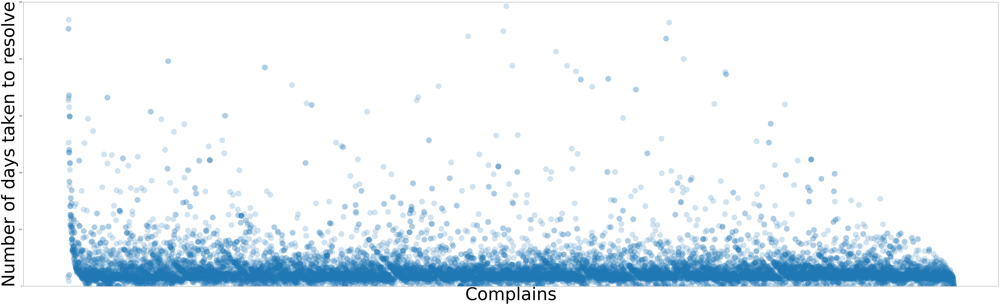

In [25]:

# Plotting a scattered plot to display complains and number of days took to resolve it.
plt.figure(figsize = (100, 30))
plt.ylim(0,500)

plt.scatter(df_wo_NAsIn_DateOfResolution['ComplaintID'], df_wo_NAsIn_DateOfResolution['No_of_DaysToResolve'], 
            alpha=0.2, s=1000,  marker='o') 
plt.xticks([])
plt.xlabel('Complains', fontsize=100)
plt.ylabel('Number of days taken to resolve', fontsize=100);

plt.show()


#### In the above plots I am trying to show the positive corelation between number of days taken to resolve the complain and the 'poor' DRC class. It means the more the days required to resolve the complain, there is high chance of it being 'poor'  DRC class.


#### Following is the Zoomed in version of the same graph with color coding for different DRC classes.

In [26]:

# Plotting a scattered plot to display complains and number of days took to resolve it using plotly. 
# Its a zoomed in version of the above plot.
fig = px.scatter(df_wo_NAsIn_DateOfResolution, x="ComplaintID", y="No_of_DaysToResolve", color="DRC", 
                 size='ComplaintID', hover_data=['No_of_DaysToResolve'], range_y=[0,500])
fig.update_layout(title='Effect of No. of days required to resolve vs DRC class')

fig.show()


#### In the above plot it is most likely that, a less number of days to resolve the complain then most likely it will be classified as an 'outstanding' DRC class and on the other hand more number of days to resolve the complain then most likely it will be classified as a 'poor' DRC class.

#### Extracting only 'poor' DRC class from the 'data_original' dataframe.

In [27]:

# Extract only 'poor' DRC class from the 'data_original' dataframe and store it in 'df_DRC_poor' dataframe.
df_DRC_poor = data_original.loc[data_original.DRC == 'poor']
df_DRC_poor.head(1)


,Company,FileNo,DateOfRegistration,DateOfResolution,Coverage,SubCoverage,Reason,SubReason,EnforcementAction,Conclusion,RecoveredFromInsurer,ResolutionStatus,ComplaintID,InsurerID,State,DRC
0,Middlesex Mutual Assurance Company,101588,2010-03-28,2010-04-13,Homeowners,NaN,Unfair Claims Practice,Claim Delays,Company Position Upheld,Unjustified,0.0,Closed,345501,Insurer5626,Connecticut,poor


In [28]:

df_DRC_poor.isnull().sum()


Company                    0
FileNo                     0
DateOfRegistration         0
DateOfResolution          41
Coverage                1635
SubCoverage             4505
Reason                     0
SubReason                  0
EnforcementAction          0
Conclusion                 0
RecoveredFromInsurer       0
ResolutionStatus           0
ComplaintID                0
InsurerID                  0
State                      0
DRC                        0
dtype: int64

In [29]:

# Replacing all NAs with a blank space ''.
df_DRC_poor = df_DRC_poor.replace(np.nan, '', regex=True)


In [30]:

df_DRC_poor.isnull().sum()


Company                 0
FileNo                  0
DateOfRegistration      0
DateOfResolution        0
Coverage                0
SubCoverage             0
Reason                  0
SubReason               0
EnforcementAction       0
Conclusion              0
RecoveredFromInsurer    0
ResolutionStatus        0
ComplaintID             0
InsurerID               0
State                   0
DRC                     0
dtype: int64

#### Plotting the word cloud of 'Coverage', 'SubCoverage', 'Reason' and 'SubReason'  for only poor DRC class to find some interesting patterns or frequently used texts(terms)  for 'poor' DRC class.

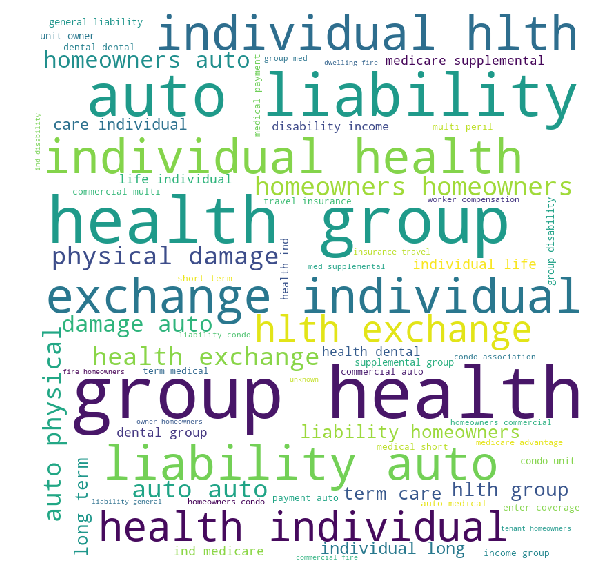

In [31]:

# Plotting the word cloud of the 'Coverage' column of only those records who are having 'poor' class in 'DRC' column.
func_PlotImageCloud(df_DRC_poor.Coverage)


##### In the above word cloud of Coverage, we can possitively associate some key words from our 'Coverage' data to 'poor' class in 'DRC' column.
##### For example : 'group health', 'health group', 'auto liability', 'exchange health', 'individual health', etc.

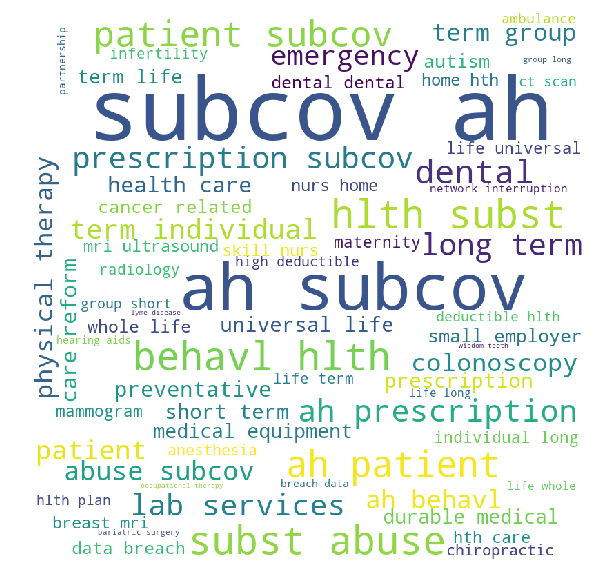

In [32]:

# Plotting the word cloud of the 'SubCoverage' column of only those records who are having 'poor' class in 'DRC' column.
func_PlotImageCloud(df_DRC_poor.SubCoverage)


##### In the above word cloud of 'Sub Coverage', we can possitively associate some key words from our 'SubCoverage' data to 'poor' class in 'DRC' column.
##### For example : 'subcov ah', 'prescription', 'subst abuse', 'lab services', 'hlth subst', 'dental' etc.

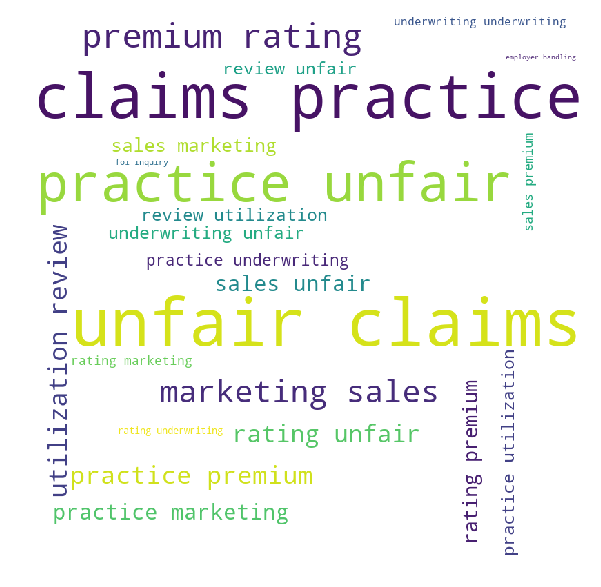

In [33]:

# Plotting the word cloud of the 'Reason' column of only those records who are having 'poor' class in 'DRC' column.
func_PlotImageCloud(df_DRC_poor.Reason)


##### In the above word cloud of 'Reason', we can possitively associate some key words from our 'Reason' data to 'poor' class in 'DRC' column.
##### For example : 'Unfair claims', 'practice unfair', 'claims practice', 'premium rating', 'utilization review', 'marketing sales' etc.

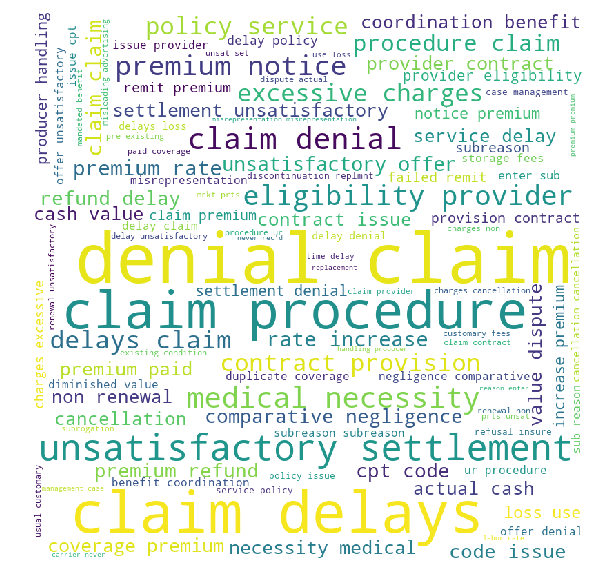

In [34]:

# Plotting the word cloud of the 'SubReason' column of only those records who are having 'poor' class in 'DRC' column.
func_PlotImageCloud(df_DRC_poor.SubReason)


##### In the above word cloud of 'SubReason', we can possitively associate some key words from our 'SubReason' data to 'poor' class in 'DRC' column.
##### For example : 'denial claim', 'claim delays', 'claim procedure', 'Unsatisfactory settlement', 'contract provission', 'excessive charges' etc.

In [35]:

# Displaying the count of Unique values in all columns of 'data_original' dataframe.
for i in data_original.columns.values:
    print (i,' ---> ',len(data_original[i].unique()))
    

Company  --->  539
FileNo  --->  11910
DateOfRegistration  --->  1149
DateOfResolution  --->  1073
Coverage  --->  66
SubCoverage  --->  73
Reason  --->  10
SubReason  --->  66
EnforcementAction  --->  52
Conclusion  --->  6
RecoveredFromInsurer  --->  1998
ResolutionStatus  --->  3
ComplaintID  --->  15565
InsurerID  --->  539
State  --->  1
DRC  --->  3


#### Plotting a histogram to display 'DRC' classes in our data.

In [36]:

# Using plotly to plot the histogram of 'DRC' class.
tips = data_original
fig = px.histogram(tips, x="DRC")
fig.show()


#### In the above graph it is clear that 'poor' DRC is more frequent.

#### Plotting a histogram to display 'Reason' on X-axis and their distribution across our target classes i.e. 'DRC' class .

In [37]:

# Using plotly to plot the histogram of 'Reason' class.
fig = px.histogram(tips, x="Reason", color="DRC")
fig.show()


#### In the above graph we can analyse that 'Unfair Claims Practice','Premium and Rating','Marketing/Sales' and 'Utilization Review' are the reasons which are most likely associated with 'poor' DRC.

#### Plotting a histogram to display 'ResolutionStatus' on X-axis and their distribution across our target classes i.e. 'DRC' class .

In [38]:

# Using plotly to plot the histogram of 'ResolutionStatus' class.
fig = px.histogram(tips, x="ResolutionStatus", color="DRC")
fig.show()


#### 'ResolutionStatus' feature itself does not show much variation, so we can't analyse much from this feature.

#### Plotting a histogram to display 'Conclusion' on X-axis and their distribution across our target classes i.e. 'DRC' class .

In [39]:

# Using plotly to plot the histogram of 'Conclusion' class.
fig = px.histogram(tips, x="Conclusion", color="DRC")
fig.show()


#### In the above graph we can analyse that 'Furnished Information','Justified' and 'Voluntary Reconsider' are the Conclusions which are most likely associated with 'poor' DRC.

#### In the following plot I am trying to find some relation between 'RecoveredFromInsurer and 'DRC' columns.

In [40]:
# Its a zoomed in version of the above plot.
fig = px.scatter(raw_data, x="ComplaintID", y="RecoveredFromInsurer", color="DRC",
                  hover_data=['RecoveredFromInsurer'], range_y=[0,1500])
fig.update_layout(title='Effect of Amount Recovered From Insurer vs DRC class')

fig.show()

#### From the above plot we can't classify or get any clear association of 'RecoveredFromInsurer' and 'DRC' columns.

#### Lets check the NAs in the data.

In [41]:

data_original.isnull().sum()


Company                     0
FileNo                      0
DateOfRegistration          0
DateOfResolution           44
Coverage                 2746
SubCoverage             10110
Reason                      0
SubReason                   0
EnforcementAction           0
Conclusion                  0
RecoveredFromInsurer        0
ResolutionStatus            0
ComplaintID                 0
InsurerID                   0
State                       0
DRC                         0
dtype: int64

In [42]:

# Displaying NAs count of only those columns who are having NAs.
null_columns=data_original.columns[data_original.isnull().any()]
data_original[null_columns].isnull().sum()


DateOfResolution       44
Coverage             2746
SubCoverage         10110
dtype: int64

#### In the above output we found that there are NA values in 'DateOfResolution', 'Coverage' and 'SubCoverage' columns. 
#### So lets handle them one by one.

In [43]:

# Displaying the DRC's class counts.
print (pd.value_counts(data_original['DRC'].values))


poor           8551
average        3809
outstanding    3205
dtype: int64


#### I am planning to remove all those rows in which both 'Coverage' and 'SubCoverage' are blank. 
#### Prior to this I am checking the percentage of them in data.

In [44]:

# Storing the names of all the columns of 'data_original' dataframe in 'all_columns' array.
all_columns = data_original.columns


In [45]:

# Displaying the percentage of those rows who are having NAs in both 'Coverage' and 'SubCoverage' columns.
print('Percentage of NAs in both  \'Coverage\' and \'SubCoverage\' column is ',
      ((len(pd.merge(data_original[data_original["Coverage"].isnull()][all_columns], 
                     data_original[data_original["SubCoverage"].isnull()][all_columns],
                     how='inner')) / len(data_original) ) * 100), '%.')


Percentage of NAs in both  'Coverage' and 'SubCoverage' column is  17.642145840025698 %.


#### Its almost 18% of the whole data. So its not a good idea to drop these rows straight away. So I have to do some thing else.

#### So to analyse this selected portion of data visually I am extracting this data into CSV.

In [46]:

df_temp_Cov_N_SubCov = pd.merge(data_original[data_original["Coverage"].isnull()][all_columns], 
                     data_original[data_original["SubCoverage"].isnull()][all_columns],
                     how='inner')
df_temp_Cov_N_SubCov.to_csv("Temp_Coverage_SubCoverage.csv", sep=",", header=True)


#### After analysing the CSV manually, I don't found any significant pattern. So before removing these rows, I just want to analyse the before and after effects of these rows on my target variable.

In [47]:

colors_pie_chart = ["#E13F29", "#D69A80", "#D63B59"]
labels = 'poor','average','outstanding'


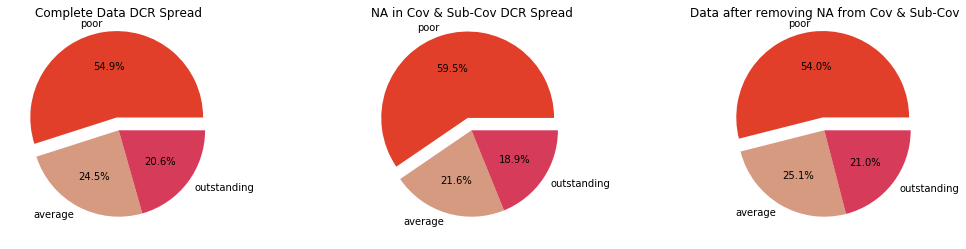

In [48]:

fig = plt.figure(figsize=[14,10])

# Counting the frequency of DRC for each unique value in Original data i.e. 'data_original' and plotting it on a pie-chart.
df_pie_plot_DRC_FullData = pd.value_counts(data_original['DRC'].values)
ax1 = fig.add_axes([0, 0, .30, .30], aspect=1)
ax1.pie(df_pie_plot_DRC_FullData, labels=labels, colors=colors_pie_chart, autopct='%1.1f%%', startangle=0, explode=(0.15, 0, 0))

# Counting the frequency of DRC for each unique value in those data where 'Coverage' and 'Sub_Coverage' columns were having NAs i.e. 'df_temp_Cov_N_SubCov' and plotting it on a pie-chart.
df_pie_plot_DRC_Cov_N_SubCov = pd.value_counts(df_temp_Cov_N_SubCov['DRC'].values)
ax2 = fig.add_axes([.35, .0, .30, .30], aspect=1)
ax2.pie(df_pie_plot_DRC_Cov_N_SubCov, labels=labels, colors=colors_pie_chart, autopct='%1.1f%%', startangle=0, explode=(0.15, 0, 0))

# Extracting only those data points which were not having NAs in 'Coverage' and 'Sub_Coverage' columns from 'data_original' into 'df_temp_data_after_removing_NA'.
df_temp_data_after_removing_NA = data_original
df_temp_data_after_removing_NA = pd.concat([df_temp_data_after_removing_NA, df_temp_Cov_N_SubCov, df_temp_Cov_N_SubCov]).drop_duplicates(keep=False)

# Counting the frequency of DRC for each unique value after removing those rows which were having NAs in 'Coverage' and 'Sub_Coverage' columns i.e. 'df_temp_data_after_removing_NA' and plotting it on a pie-chart.
df_pie_plot_temp_data_after_removing_NA = pd.value_counts(df_temp_data_after_removing_NA['DRC'].values)
ax3 = fig.add_axes([.70, .0, .30, .30], aspect=1)
ax3.pie(df_pie_plot_temp_data_after_removing_NA, labels=labels, colors=colors_pie_chart, autopct='%1.1f%%', startangle=0, explode=(0.15, 0, 0))

ax1.set_title('Complete Data DCR Spread')
ax2.set_title('NA in Cov & Sub-Cov DCR Spread')
ax3.set_title('Data after removing NA from Cov & Sub-Cov')

plt.show()


#### From the above pie-chart we can conclude that even if we remove that 18% of data in which columns 'Coverage' and 'SubCoverage', both having NAs, then also its not affect much on the distirbution of target variable, i.e. Before removing NAs 'poor' DCR was 54.9% and after removing NAs from these columns its showing 54.0%.

#### So we can safely remove these data points where there is NAs in both 'Coverage' and 'SubCoverage' columns at the same time. So I am removing them from my original data.

In [49]:

data_original = df_temp_data_after_removing_NA


In [50]:

null_columns=data_original.columns[data_original.isnull().any()]
data_original[null_columns].isnull().sum()


DateOfResolution      35
SubCoverage         7364
dtype: int64

#### I am planning to replace all the NAs in 'DateOfResolution' column with '2099-12-31' value as a default date.

In [51]:

data_original.loc[data_original['DateOfResolution'].isnull(), ['DateOfResolution']] = '2099-12-31'


In [52]:

null_columns=data_original.columns[data_original.isnull().any()]
data_original[null_columns].isnull().sum()


SubCoverage    7364
dtype: int64

In [53]:

data_original.isnull().sum()


Company                    0
FileNo                     0
DateOfRegistration         0
DateOfResolution           0
Coverage                   0
SubCoverage             7364
Reason                     0
SubReason                  0
EnforcementAction          0
Conclusion                 0
RecoveredFromInsurer       0
ResolutionStatus           0
ComplaintID                0
InsurerID                  0
State                      0
DRC                        0
dtype: int64

#### From the above output we can see that there is only 'SubCoverage' column which is having NA value. It is having 7364 NAs       

In [54]:

print(( data_original['SubCoverage'].isnull().sum()/len(data_original) ) * 100 )


57.445978625477814


#### As 57% of the data of 'SubCoverage' column is having NAs, so its better to remove this column from our original data, as it will not contribute much in model building. 

In [55]:

data_original = data_original.drop('SubCoverage', axis=1)
all_columns = data_original.columns


In [56]:

data_original['No_of_DaysToResolve'] = (
    (
        (
            data_original.DateOfResolution.apply(lambda x: pd.Series(pd.to_datetime(x,format='%Y-%m-%d', errors='coerce'))) - 
            data_original.DateOfRegistration.apply(lambda x: pd.Series(pd.to_datetime(x,format='%Y-%m-%d', errors='coerce')))
        ) / np.timedelta64(1, 'D')
    ).astype("int32")
)

data_original[['No_of_DaysToResolve', 'DateOfResolution', 'DateOfRegistration']].head(5)


,No_of_DaysToResolve,DateOfResolution,DateOfRegistration
0,16,2010-04-13,2010-03-28
1,1334,2014-12-31,2011-05-07
2,64,2014-01-06,2013-11-03
4,18,2014-01-05,2013-12-18
5,22,2014-03-03,2014-02-09


In [57]:
print('-------------------------------')

print(data_original.DRC.value_counts())

drc_perc = round((data_original.DRC.value_counts(sort=False)/sum(data_original.DRC.value_counts()) * 100),2)

print('-------------------------------')

print(drc_perc)

print('-------------------------------')

-------------------------------
poor           6916
average        3216
outstanding    2687
Name: DRC, dtype: int64
-------------------------------
outstanding    20.96
poor           53.95
average        25.09
Name: DRC, dtype: float64
-------------------------------


#### In the following plot I am plotting the percentage of 'DRC' classes in our data.

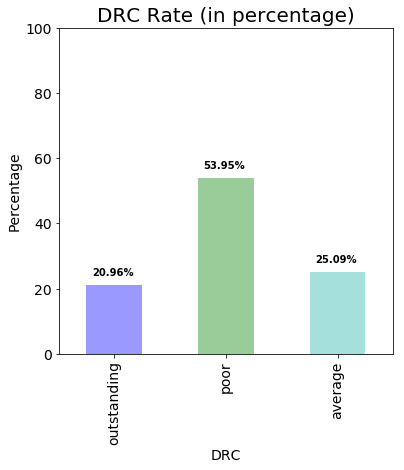

In [58]:
drc_perc.plot( kind='bar', figsize = (6,6), color = ['blue', 'green', 'lightseagreen'], alpha = 0.4, fontsize = 14 )

plt.ylim([0,100])

plt.xlabel('DRC', fontsize = 14)
plt.ylabel('Percentage', fontsize = 14)

plt.title('DRC Rate (in percentage)', fontsize = 20)

for i, v in enumerate(drc_perc):
    plt.text(i-0.2,v+3, str(v) + "%", color='black', fontweight='bold')

plt.show()

#### From the above plot it is clear that the data is bias towards 'poor' DRC class, i.e. almost 54%.

In [59]:

months = {
    1: 'January', 
    2: 'February',
    3: 'March', 
    4: 'April',
    5: 'May', 
    6: 'June',
    7: 'July', 
    8: 'August',
    9: 'September', 
    10: 'October',
    11: 'November', 
    12: 'December'
}

weekdays = {
    0: 'Monday',
    1: 'Tuesday', 
    2: 'Wednesday',
    3: 'Thursday', 
    4: 'Friday',
    5: 'Saturday', 
    6: 'Sunday'
}


In [60]:

# Extracting Date, Month, Year and DayOfTheWeek fromm the DateOfResolution column 
# and storing it in 'DtOf_Reso_Date', 'DtOf_Reso_Month', 'DtOf_Reso_Year' and 'DtOf_Reso_Week_Day' respectively.
data_original['DtOf_Reso_Date'] = pd.DatetimeIndex(pd.to_datetime(data_original['DateOfResolution'],format='%Y-%m-%d', errors='coerce')).day
data_original['DtOf_Reso_Month'] = pd.DatetimeIndex(pd.to_datetime(data_original['DateOfResolution'],format='%Y-%m-%d', errors='coerce')).month
data_original['DtOf_Reso_Week_Day'] = pd.DatetimeIndex(pd.to_datetime(data_original['DateOfResolution'],format='%Y-%m-%d', errors='coerce')).dayofweek
data_original['DtOf_Reso_Year'] = pd.DatetimeIndex(pd.to_datetime(data_original['DateOfResolution'],format='%Y-%m-%d', errors='coerce')).year

# Converting the MonthCode and WeekDay code in redable format according to above dictionaries and storing it.
data_original.DtOf_Reso_Month = [months[item] for item in data_original.DtOf_Reso_Month]
data_original.DtOf_Reso_Week_Day = [weekdays[item] for item in data_original.DtOf_Reso_Week_Day]

data_original[['DateOfResolution','DtOf_Reso_Date','DtOf_Reso_Month', 'DtOf_Reso_Week_Day','DtOf_Reso_Year']].head(5)


,DateOfResolution,DtOf_Reso_Date,DtOf_Reso_Month,DtOf_Reso_Week_Day,DtOf_Reso_Year
0,2010-04-13,13,April,Tuesday,2010
1,2014-12-31,31,December,Wednesday,2014
2,2014-01-06,6,January,Monday,2014
4,2014-01-05,5,January,Sunday,2014
5,2014-03-03,3,March,Monday,2014


In [61]:

# Extracting Date, Month, Year and DayOfTheWeek fromm the DateOfRegistration column 
# and storing it in 'DtOf_Regi_Date', 'DtOf_Regi_Month', 'DtOf_Regi_Year' and 'DtOf_Regi_Week_Day' respectively.
data_original['DtOf_Regi_Date'] = pd.DatetimeIndex(pd.to_datetime(data_original['DateOfRegistration'],format='%Y-%m-%d', errors='coerce')).day
data_original['DtOf_Regi_Month'] = pd.DatetimeIndex(pd.to_datetime(data_original['DateOfRegistration'],format='%Y-%m-%d', errors='coerce')).month
data_original['DtOf_Regi_Week_Day'] = pd.DatetimeIndex(pd.to_datetime(data_original['DateOfRegistration'],format='%Y-%m-%d', errors='coerce')).dayofweek
data_original['DtOf_Regi_Year'] = pd.DatetimeIndex(pd.to_datetime(data_original['DateOfRegistration'],format='%Y-%m-%d', errors='coerce')).year

# Converting the MonthCode and WeekDay code in redable format according to above dictionaries and storing it.
data_original.DtOf_Regi_Month = [months[item] for item in data_original.DtOf_Regi_Month]
data_original.DtOf_Regi_Week_Day = [weekdays[item] for item in data_original.DtOf_Regi_Week_Day]

data_original[['DateOfRegistration','DtOf_Regi_Date','DtOf_Regi_Month', 'DtOf_Regi_Week_Day','DtOf_Regi_Year']].head(5)


,DateOfRegistration,DtOf_Regi_Date,DtOf_Regi_Month,DtOf_Regi_Week_Day,DtOf_Regi_Year
0,2010-03-28,28,March,Sunday,2010
1,2011-05-07,7,May,Saturday,2011
2,2013-11-03,3,November,Sunday,2013
4,2013-12-18,18,December,Wednesday,2013
5,2014-02-09,9,February,Sunday,2014


#### In the following histogram I am trying to plot the total number of complaints registered in each year and their distribution in 'DRC' classes.

In [62]:

# Using plotly to plot the histogram of 'DtOf_Regi_Year'.
fig = px.histogram(data_original, x="DtOf_Regi_Year", color="DRC")
fig.show()


#### From the above chart we can say that most of the data is from 2014 to 2017 and it is almost evenly distributed in all years.

#### In the following histogram I am trying to plot the total number of complaints registered in each month and their distribution in 'DRC' classes.

In [63]:

# Using plotly to plot the histogram of 'DtOf_Regi_Month'.
fig = px.histogram(data_original, x="DtOf_Regi_Month", color="DRC")
fig.show()


#### From the above chart we can say that most of the complaints are registered on the first quarter of the year.

#### In the following histogram I am trying to plot the total number of complaints registered on each day of the month and their distribution in 'DRC' classes.

In [64]:

# Using plotly to plot the histogram of 'DtOf_Reso_Week_Day'.
fig = px.histogram(data_original, x="DtOf_Regi_Date", color="DRC")
fig.show()


#### In the following histogram I am trying to plot the total number of complaints registered on each day of the week and their distribution in 'DRC' classes.

In [65]:

# Using plotly to plot the histogram of 'DtOf_Reso_Week_Day'.
fig = px.histogram(data_original, x="DtOf_Regi_Week_Day", color="DRC")
fig.show()


#### Most of the complains are registered on Sunday, Monday and Tuesday as compared to other days of the week.

## A very interesting observation is that there are no complains registered on Fridays.

#### In the following histogram I am trying to plot the total number of complaints resolved in each year and their distribution in 'DRC' classes.

In [66]:

# Using plotly to plot the histogram of 'DtOf_Reso_Year'.
fig = px.histogram(data_original, x="DtOf_Reso_Year", color="DRC")
fig.show()


#### We have imputed the date of those data points whose Date of Resolution were NAs with 2099 as an year. So we can clearly see from the above chart that, almost all the cases with no Date of Resolution is having 'poor' DRC class. 

In [67]:

# Using plotly to plot the histogram of 'DtOf_Reso_Year'.
df_temp_without2099 = data_original.loc[data_original.DtOf_Reso_Year != 2099]
fig = px.histogram(df_temp_without2099, x="DtOf_Reso_Year", color="DRC")
fig.show()


#### In the following histogram I am trying to plot the total number of complaints resolved in each month and their distribution in 'DRC' classes.

In [68]:

# Using plotly to plot the histogram of 'DtOf_Reso_Month'.
fig = px.histogram(data_original, x="DtOf_Reso_Month", color="DRC")
fig.show()


#### In the following histogram I am trying to plot the total number of complaints resolved on each day of the month and their distribution in 'DRC' classes.

In [69]:

# Using plotly to plot the histogram of 'DtOf_Reso_Date'.
fig = px.histogram(data_original, x="DtOf_Reso_Date", color="DRC")
fig.show()


#### In the following histogram I am trying to plot the total number of complaints resolved on each day of the week and their distribution in 'DRC' classes.

In [70]:

# Using plotly to plot the histogram of 'DtOf_Reso_Week_Day'.
fig = px.histogram(data_original, x="DtOf_Reso_Week_Day", color="DRC")
fig.show()


## Again a very interesting observation is that there are no complains resolved on Fridays.

# Now lets clean all the data by loading the original data.

In [71]:

data_original = f_df_complaints


# Pre-processing, Feature-engineering and Visualisation

In [72]:

# Displaying all the columns from 'data_original'.
data_original.columns


Index(['Company', 'FileNo', 'DateOfRegistration', 'DateOfResolution',
       'Coverage', 'SubCoverage', 'Reason', 'SubReason', 'EnforcementAction',
       'Conclusion', 'RecoveredFromInsurer', 'ResolutionStatus', 'ComplaintID',
       'InsurerID', 'State'],
      dtype='object')

In [73]:

# Displaying the datatypes of all the columns in 'data_original' dataframe.
data_original.dtypes


Company                  object
FileNo                    int64
DateOfRegistration       object
DateOfResolution         object
Coverage                 object
SubCoverage              object
Reason                   object
SubReason                object
EnforcementAction        object
Conclusion               object
RecoveredFromInsurer    float64
ResolutionStatus         object
ComplaintID               int64
InsurerID                object
State                    object
dtype: object

In [74]:

# Displaying the count of Unique values in all columns of 'data_original' dataframe.
for i in data_original.columns.values:
    print (i,' ---> ',len(data_original[i].unique()))
    

Company  --->  539
FileNo  --->  11910
DateOfRegistration  --->  1149
DateOfResolution  --->  1073
Coverage  --->  66
SubCoverage  --->  73
Reason  --->  10
SubReason  --->  66
EnforcementAction  --->  52
Conclusion  --->  6
RecoveredFromInsurer  --->  1998
ResolutionStatus  --->  3
ComplaintID  --->  15565
InsurerID  --->  539
State  --->  1


In [75]:

# Displaying the NAs count in all the columns of 'data_original'.
data_original.isnull().sum()


Company                     0
FileNo                      0
DateOfRegistration          0
DateOfResolution           44
Coverage                 2746
SubCoverage             10110
Reason                      0
SubReason                   0
EnforcementAction           0
Conclusion                  0
RecoveredFromInsurer        0
ResolutionStatus            0
ComplaintID                 0
InsurerID                   0
State                       0
dtype: int64

In [76]:

# Removing the data points having NAs in 'DateOfResolution' column of 'data_original' dataframe and 
# storing it in 'df_wo_NAsIn_DateOfResolution' dataframe.
df_wo_NAsIn_DateOfResolution = data_original.dropna(axis=0, subset=['DateOfResolution'])


In [77]:

# Displaying the NAs count in all the columns of 'df_wo_NAsIn_DateOfResolution'.
df_wo_NAsIn_DateOfResolution.isnull().sum()


Company                     0
FileNo                      0
DateOfRegistration          0
DateOfResolution            0
Coverage                 2737
SubCoverage             10081
Reason                      0
SubReason                   0
EnforcementAction           0
Conclusion                  0
RecoveredFromInsurer        0
ResolutionStatus            0
ComplaintID                 0
InsurerID                   0
State                       0
dtype: int64

In [78]:

# Subtracting 'DateOfRegistration' from 'DateOfResolution' and storing the integer difference in 'No_of_DaysToResolve' column.
df_wo_NAsIn_DateOfResolution['No_of_DaysToResolve'] = (
    (
        (
            df_wo_NAsIn_DateOfResolution.DateOfResolution.apply(lambda x: pd.Series(pd.to_datetime(x,format='%Y-%m-%d', errors='coerce'))) - 
            df_wo_NAsIn_DateOfResolution.DateOfRegistration.apply(lambda x: pd.Series(pd.to_datetime(x,format='%Y-%m-%d', errors='coerce')))
        ) / np.timedelta64(1, 'D')
    ).astype("int32")
)

df_wo_NAsIn_DateOfResolution[['No_of_DaysToResolve', 'DateOfResolution', 'DateOfRegistration']].head(5)


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,No_of_DaysToResolve,DateOfResolution,DateOfRegistration
0,16,2010-04-13,2010-03-28
1,2396,2016-11-01,2010-04-11
2,1431,2014-06-22,2010-07-22
3,1431,2014-06-22,2010-07-22
4,1498,2014-12-30,2010-11-23


#### From the output of last few commands we can easily conclude following 2 things.

#### 1) The data belongs to only one State i.e. 'Connecticut', so this feature will not add much to our model. 

#### 2) ComplaintID column is a uniqueId column so it will not help our cause as well i.e. for building model.

#### So I am planning to remove both of them from our dataset.

In [79]:

# Dropping columns 'ComplaintID' and 'State' from 'data_original'.
columns_temp_unwanted = ['ComplaintID', 'State']
data_original = data_original.drop(columns_temp_unwanted, axis=1)
data_original.shape


(15565, 13)

#### Displaying the frequency of each unique value in the following columns, to get more insight of the data.

In [80]:
columns_temp = ['Company', 'FileNo', 'Coverage', 'SubCoverage', 'Reason', 'SubReason', 
                'EnforcementAction', 'Conclusion', 'ResolutionStatus', 'InsurerID']

for i in columns_temp:
    print (i)
    print (pd.value_counts(data_original[i].values))

Company
Anthem Health Plans, Inc                                      1954
ConnectiCare Insurance Company, Inc                            622
Allstate Fire and Casualty Insurance Company                   564
GEICO General Insurance Company                                401
ConnectiCare Benefits, Inc.                                    394
UnitedHealthcare Insurance Company                             386
ConnectiCare Inc                                               372
Progressive Direct Insurance Company                           300
Allstate Insurance Company                                     292
Progressive Casualty Insurance Company                         287
Oxford Health Plans (CT), Inc                                  281
State Farm Fire & Casualty Company                             244
LM General Insurance Company                                   240
State Farm Mutual Automobile Insurance Company                 207
HealthyCT, Inc.                                       

In [81]:

# Displaying the summary of 'data_original'.
data_original.describe(include='all')


,Company,FileNo,DateOfRegistration,DateOfResolution,Coverage,SubCoverage,Reason,SubReason,EnforcementAction,Conclusion,RecoveredFromInsurer,ResolutionStatus,InsurerID
count,15565,15565.000000,15565,15521,12819,5455,15565,15565,15565,15565,15565.000000,15565,15565
unique,539,NaN,1149,1072,65,72,10,66,52,6,NaN,3,539
top,"Anthem Health Plans, Inc",NaN,2017-10-17,2014-10-28,Auto Liability,No SubCov - AH,Unfair Claims Practice,Denial of Claim,Company Position Upheld,Unjustified,NaN,Closed,Insurer5330
freq,1954,NaN,49,72,2492,1910,10011,2627,4130,7515,NaN,15521,1954
mean,NaN,666343.643302,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1253.019656,NaN,NaN
std,NaN,129338.222318,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14983.840980,NaN,NaN
min,NaN,101588.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN
25%,NaN,600208.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN
50%,NaN,700676.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN
75%,NaN,801379.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN


In [82]:

# Displaying the summary of 'data_original' i.e. not-null(Not NAs) count and datatypes of each column.
data_original.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15565 entries, 0 to 15564
Data columns (total 13 columns):
Company                 15565 non-null object
FileNo                  15565 non-null int64
DateOfRegistration      15565 non-null object
DateOfResolution        15521 non-null object
Coverage                12819 non-null object
SubCoverage             5455 non-null object
Reason                  15565 non-null object
SubReason               15565 non-null object
EnforcementAction       15565 non-null object
Conclusion              15565 non-null object
RecoveredFromInsurer    15565 non-null float64
ResolutionStatus        15565 non-null object
InsurerID               15565 non-null object
dtypes: float64(1), int64(1), object(11)
memory usage: 1.5+ MB


#### Lets check the NAs in the data.

In [83]:

data_original.isnull().sum()


Company                     0
FileNo                      0
DateOfRegistration          0
DateOfResolution           44
Coverage                 2746
SubCoverage             10110
Reason                      0
SubReason                   0
EnforcementAction           0
Conclusion                  0
RecoveredFromInsurer        0
ResolutionStatus            0
InsurerID                   0
dtype: int64

In [84]:

# Displaying NAs count of only those columns who are having NAs.
null_columns=data_original.columns[data_original.isnull().any()]
data_original[null_columns].isnull().sum()


DateOfResolution       44
Coverage             2746
SubCoverage         10110
dtype: int64

#### In the above output we found that there are NA values in 'DateOfResolution', 'Coverage' and 'SubCoverage' columns. 
#### So lets handle them one by one.

In [85]:

all_columns = data_original.columns


In [86]:

# Displaying the percentage of those rows who are having NAs in both 'Coverage' and 'SubCoverage' columns.
print('Percentage of NAs in both  \'Coverage\' and \'SubCoverage\' column is ',
      ((len(pd.merge(data_original[data_original["Coverage"].isnull()][all_columns], 
                     data_original[data_original["SubCoverage"].isnull()][all_columns],
                     how='inner')) / len(data_original) ) * 100), '%.')


Percentage of NAs in both  'Coverage' and 'SubCoverage' column is  17.642145840025698 %.


#### Its almost 18% of the whole data. So its not a good idea to drop these rows straight away. So I have to do some thing else.

#### So to analyse this selected portion of data visually I am extracting this data into CSV.

In [87]:

df_temp_Cov_N_SubCov = pd.merge(data_original[data_original["Coverage"].isnull()][all_columns], 
                     data_original[data_original["SubCoverage"].isnull()][all_columns],
                     how='inner')
df_temp_Cov_N_SubCov.to_csv("Temp_Coverage_SubCoverage.csv", sep=",", header=True)


#### After analysing the CSV manually, I don't found any significant pattern. So before removing these rows, I just want to analyse the before and after effects of these rows on my target variable.

In [88]:
# Extracting only those data points which were not having NAs in 'Coverage' and 'Sub_Coverage' columns from 'data_original' into 'df_temp_data_after_removing_NA'.
df_temp_data_after_removing_NA = data_original
df_temp_data_after_removing_NA = pd.concat([df_temp_data_after_removing_NA, df_temp_Cov_N_SubCov, df_temp_Cov_N_SubCov]).drop_duplicates(keep=False)

In [89]:

data_original = df_temp_data_after_removing_NA


In [90]:

data_original.shape


(12819, 13)

In [91]:

data_original.head(5)


,Company,FileNo,DateOfRegistration,DateOfResolution,Coverage,SubCoverage,Reason,SubReason,EnforcementAction,Conclusion,RecoveredFromInsurer,ResolutionStatus,InsurerID
0,Middlesex Mutual Assurance Company,101588,2010-03-28,2010-04-13,Homeowners,NaN,Unfair Claims Practice,Claim Delays,Company Position Upheld,Unjustified,0.00,Closed,Insurer5626
1,Liberty Mutual Fire Insurance Company,101805,2010-04-11,2016-11-01,Homeowners,NaN,Unfair Claims Practice,Claim Procedure,Satisfactory Explanation,Unjustified,0.00,Closed,Insurer5589
2,QBE Insurance Corporation,103398,2010-07-22,2014-06-22,Condo Association,NaN,Unfair Claims Practice,Denial of Claim,Company Position Upheld,Unjustified,0.00,Closed,Insurer5750
3,Travelers Indemnity Company of Connecticut (The),103398,2010-07-22,2014-06-22,Condo Association,NaN,Unfair Claims Practice,Claim Delays,Claim Settled,Unjustified,18796.82,Closed,Insurer5839
4,Hermitage Insurance Company,105636,2010-11-23,2014-12-30,Unknown,NaN,FOI Inquiry,No Subreason,Furnished Information,Furnished Information,0.00,Closed,Insurer5547


In [92]:

null_columns=data_original.columns[data_original.isnull().any()]
data_original[null_columns].isnull().sum()


DateOfResolution      35
SubCoverage         7364
dtype: int64

In [93]:

# displaying all those rows which are having NAs in 'DateOfResolution' column.
data_original[data_original["DateOfResolution"].isnull()][all_columns]


,Company,FileNo,DateOfRegistration,DateOfResolution,Coverage,SubCoverage,Reason,SubReason,EnforcementAction,Conclusion,RecoveredFromInsurer,ResolutionStatus,InsurerID
2608,Liberty Mutual Fire Insurance Company,503800,2014-08-18,NaN,Homeowners,NaN,Unfair Claims Practice,Claim Procedure,Contract Provision,Unjustified,0.00,Re-Opened,Insurer5589
8995,Encompass Insurance Company of America,702707,2016-06-09,NaN,Homeowners,NaN,Unfair Claims Practice,Denial of Claim,Contract Provision,Unjustified,0.00,Re-Opened,Insurer5446
9788,Nationwide Mutual Fire Insurance Company,704057,2016-09-07,NaN,General Liability,NaN,Unfair Claims Practice,Claim Delays,Company Position Upheld,Unjustified,0.00,Re-Opened,Insurer5660
9791,Trumbull Insurance Company,704057,2016-09-07,NaN,General Liability,NaN,Underwriting,Cancellation,Pol Restored/Reinstated,Unjustified,0.00,Re-Opened,Insurer5846
12223,Allstate Insurance Company,802282,2017-05-14,NaN,Homeowners,NaN,Premium and Rating,Excessive Charges,Company Position Upheld,Unjustified,0.00,Open,Insurer5283
12588,"ConnectiCare Insurance Company, Inc",802919,2017-06-25,NaN,Group Health,Radiology,Unfair Claims Practice,Unsatisfactory Settlement,Claim Settled,Justified,0.00,Re-Opened,Insurer5406
12621,"Anthem Health Plans, Inc",802980,2017-06-27,NaN,Individual Health,Speech Therapy,Unfair Claims Practice,Claim Delays,Claim Paid With Interest,Justified,131129.00,Re-Opened,Insurer5330
12988,"Anthem Health Plans, Inc",803513,2017-07-30,NaN,Exchange-Individual Hlth,In-Patient,Unfair Claims Practice,Eligibility of Provider,Furnished Information,Furnished Information,0.00,Re-Opened,Insurer5330
13693,CSAA Affinity Insurance Company,804728,2017-10-05,NaN,Auto Liability,NaN,Unfair Claims Practice,Denial of Claim,Company Position Upheld,Unjustified,0.00,Open,Insurer5425
13729,"Anthem Health Plans, Inc",804754,2017-10-10,NaN,Individual Health,No SubCov - AH,Unfair Claims Practice,Eligibility of Provider,Claim Paid With Interest,Justified,2498.72,Re-Opened,Insurer5330


#### I am planning to replace all the NAs in 'DateOfResolution' column with '2099-12-31' value as a default date.

In [94]:

data_original.loc[data_original['DateOfResolution'].isnull(), ['DateOfResolution']] = '2099-12-31'


In [95]:

null_columns=data_original.columns[data_original.isnull().any()]
data_original[null_columns].isnull().sum()


SubCoverage    7364
dtype: int64

In [96]:

data_original.isnull().sum()


Company                    0
FileNo                     0
DateOfRegistration         0
DateOfResolution           0
Coverage                   0
SubCoverage             7364
Reason                     0
SubReason                  0
EnforcementAction          0
Conclusion                 0
RecoveredFromInsurer       0
ResolutionStatus           0
InsurerID                  0
dtype: int64

#### From the above output we can see that there is only 'SubCoverage' column which is having NA value. It is having 7364 NAs       

In [97]:
print(( data_original['SubCoverage'].isnull().sum()/len(data_original) ) * 100 )

57.445978625477814


#### As 57% of the data of 'SubCoverage' column is having NAs, so its better to remove this column from our original data, as it will not contribute much in model building. 

In [98]:

data_original = data_original.drop('SubCoverage', axis=1)
all_columns = data_original.columns


In [99]:
data_original.shape

(12819, 12)

In [100]:

data_original['No_of_DaysToResolve'] = (
    (
        (
            data_original.DateOfResolution.apply(lambda x: pd.Series(pd.to_datetime(x,format='%Y-%m-%d', errors='coerce'))) - 
            data_original.DateOfRegistration.apply(lambda x: pd.Series(pd.to_datetime(x,format='%Y-%m-%d', errors='coerce')))
        ) / np.timedelta64(1, 'D')
    ).astype("int32")
)

data_original[['No_of_DaysToResolve', 'DateOfResolution', 'DateOfRegistration']].head(5)


,No_of_DaysToResolve,DateOfResolution,DateOfRegistration
0,16,2010-04-13,2010-03-28
1,2396,2016-11-01,2010-04-11
2,1431,2014-06-22,2010-07-22
3,1431,2014-06-22,2010-07-22
4,1498,2014-12-30,2010-11-23


In [101]:
for i in data_original.columns.values:
    print (i,' ---> ',len(data_original[i].unique()))

Company  --->  539
FileNo  --->  11910
DateOfRegistration  --->  1149
DateOfResolution  --->  1073
Coverage  --->  65
Reason  --->  10
SubReason  --->  66
EnforcementAction  --->  52
Conclusion  --->  6
RecoveredFromInsurer  --->  1998
ResolutionStatus  --->  3
InsurerID  --->  539
No_of_DaysToResolve  --->  313


In [102]:
data_original.dtypes

Company                  object
FileNo                    int64
DateOfRegistration       object
DateOfResolution         object
Coverage                 object
Reason                   object
SubReason                object
EnforcementAction        object
Conclusion               object
RecoveredFromInsurer    float64
ResolutionStatus         object
InsurerID                object
No_of_DaysToResolve       int32
dtype: object

#### From the above plot it is clear that the data is bias towards 'poor' DRC class, i.e. almost 54%.

In [103]:

months = {
    1: 'January', 
    2: 'February',
    3: 'March', 
    4: 'April',
    5: 'May', 
    6: 'June',
    7: 'July', 
    8: 'August',
    9: 'September', 
    10: 'October',
    11: 'November', 
    12: 'December'
}

weekdays = {
    0: 'Monday',
    1: 'Tuesday', 
    2: 'Wednesday',
    3: 'Thursday', 
    4: 'Friday',
    5: 'Saturday', 
    6: 'Sunday'
}


In [104]:

# Extracting Date, Month, Year and DayOfTheWeek fromm the DateOfResolution column 
# and storing it in 'DtOf_Reso_Date', 'DtOf_Reso_Month', 'DtOf_Reso_Year' and 'DtOf_Reso_Week_Day' respectively.
data_original['DtOf_Reso_Date'] = pd.DatetimeIndex(pd.to_datetime(data_original['DateOfResolution'],format='%Y-%m-%d', errors='coerce')).day
data_original['DtOf_Reso_Month'] = pd.DatetimeIndex(pd.to_datetime(data_original['DateOfResolution'],format='%Y-%m-%d', errors='coerce')).month
data_original['DtOf_Reso_Week_Day'] = pd.DatetimeIndex(pd.to_datetime(data_original['DateOfResolution'],format='%Y-%m-%d', errors='coerce')).dayofweek
data_original['DtOf_Reso_Year'] = pd.DatetimeIndex(pd.to_datetime(data_original['DateOfResolution'],format='%Y-%m-%d', errors='coerce')).year

# Converting the MonthCode and WeekDay code in redable format according to above dictionaries and storing it.
data_original.DtOf_Reso_Month = [months[item] for item in data_original.DtOf_Reso_Month]
data_original.DtOf_Reso_Week_Day = [weekdays[item] for item in data_original.DtOf_Reso_Week_Day]

data_original[['DateOfResolution','DtOf_Reso_Date','DtOf_Reso_Month', 'DtOf_Reso_Week_Day','DtOf_Reso_Year']].head(5)


,DateOfResolution,DtOf_Reso_Date,DtOf_Reso_Month,DtOf_Reso_Week_Day,DtOf_Reso_Year
0,2010-04-13,13,April,Tuesday,2010
1,2016-11-01,1,November,Tuesday,2016
2,2014-06-22,22,June,Sunday,2014
3,2014-06-22,22,June,Sunday,2014
4,2014-12-30,30,December,Tuesday,2014


In [105]:

# Extracting Date, Month, Year and DayOfTheWeek fromm the DateOfRegistration column 
# and storing it in 'DtOf_Regi_Date', 'DtOf_Regi_Month', 'DtOf_Regi_Year' and 'DtOf_Regi_Week_Day' respectively.
data_original['DtOf_Regi_Date'] = pd.DatetimeIndex(pd.to_datetime(data_original['DateOfRegistration'],format='%Y-%m-%d', errors='coerce')).day
data_original['DtOf_Regi_Month'] = pd.DatetimeIndex(pd.to_datetime(data_original['DateOfRegistration'],format='%Y-%m-%d', errors='coerce')).month
data_original['DtOf_Regi_Week_Day'] = pd.DatetimeIndex(pd.to_datetime(data_original['DateOfRegistration'],format='%Y-%m-%d', errors='coerce')).dayofweek
data_original['DtOf_Regi_Year'] = pd.DatetimeIndex(pd.to_datetime(data_original['DateOfRegistration'],format='%Y-%m-%d', errors='coerce')).year

# Converting the MonthCode and WeekDay code in redable format according to above dictionaries and storing it.
data_original.DtOf_Regi_Month = [months[item] for item in data_original.DtOf_Regi_Month]
data_original.DtOf_Regi_Week_Day = [weekdays[item] for item in data_original.DtOf_Regi_Week_Day]

data_original[['DateOfRegistration','DtOf_Regi_Date','DtOf_Regi_Month', 'DtOf_Regi_Week_Day','DtOf_Regi_Year']].head(5)


,DateOfRegistration,DtOf_Regi_Date,DtOf_Regi_Month,DtOf_Regi_Week_Day,DtOf_Regi_Year
0,2010-03-28,28,March,Sunday,2010
1,2010-04-11,11,April,Sunday,2010
2,2010-07-22,22,July,Thursday,2010
3,2010-07-22,22,July,Thursday,2010
4,2010-11-23,23,November,Tuesday,2010


In [106]:
data_original.shape

(12819, 21)

In [107]:

data_original.isnull().sum()


Company                 0
FileNo                  0
DateOfRegistration      0
DateOfResolution        0
Coverage                0
Reason                  0
SubReason               0
EnforcementAction       0
Conclusion              0
RecoveredFromInsurer    0
ResolutionStatus        0
InsurerID               0
No_of_DaysToResolve     0
DtOf_Reso_Date          0
DtOf_Reso_Month         0
DtOf_Reso_Week_Day      0
DtOf_Reso_Year          0
DtOf_Regi_Date          0
DtOf_Regi_Month         0
DtOf_Regi_Week_Day      0
DtOf_Regi_Year          0
dtype: int64

In [108]:

data_original.describe(include='all')


,Company,FileNo,DateOfRegistration,DateOfResolution,Coverage,Reason,SubReason,EnforcementAction,Conclusion,RecoveredFromInsurer,...,InsurerID,No_of_DaysToResolve,DtOf_Reso_Date,DtOf_Reso_Month,DtOf_Reso_Week_Day,DtOf_Reso_Year,DtOf_Regi_Date,DtOf_Regi_Month,DtOf_Regi_Week_Day,DtOf_Regi_Year
count,12819,12819.000000,12819,12819,12819,12819,12819,12819,12819,12819.000000,...,12819,12819.000000,12819.000000,12819,12819,12819.000000,12819.000000,12819,12819,12819.000000
unique,539,NaN,1149,1073,65,10,66,52,6,NaN,...,539,NaN,NaN,12,6,NaN,NaN,12,6,NaN
top,"Anthem Health Plans, Inc",NaN,2017-10-17,2015-08-08,Auto Liability,Unfair Claims Practice,Denial of Claim,Company Position Upheld,Unjustified,NaN,...,Insurer5330,NaN,NaN,March,Monday,NaN,NaN,March,Tuesday,NaN
freq,1556,NaN,39,58,2492,8131,2153,3500,6417,NaN,...,1556,NaN,NaN,1385,2910,NaN,NaN,1326,2800,NaN
mean,NaN,666391.983072,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1142.992567,...,NaN,113.903581,15.874561,NaN,NaN,2015.948826,15.794758,NaN,NaN,2015.635385
std,NaN,129559.992003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13858.616793,...,NaN,1565.349111,8.691099,NaN,NaN,4.529221,8.665338,NaN,NaN,1.298660
min,NaN,101588.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,...,NaN,0.000000,1.000000,NaN,NaN,2010.000000,1.000000,NaN,NaN,2010.000000
25%,NaN,600182.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,...,NaN,15.000000,8.000000,NaN,NaN,2015.000000,8.000000,NaN,NaN,2015.000000
50%,NaN,700658.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,...,NaN,21.000000,16.000000,NaN,NaN,2016.000000,16.000000,NaN,NaN,2016.000000
75%,NaN,801378.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,...,NaN,33.000000,23.000000,NaN,NaN,2017.000000,23.000000,NaN,NaN,2017.000000


#### Storing the InsurerIDs in an array named 'lst_InsurerID' for later mapping with the result.

#### From the above few outputs I am planning to remove these columns 'Company', 'FileNo', 'DateOfRegistration', 'DateOfResolution' and 'InsurerID'.

In [109]:

columns_temp_unwanted = ['Company', 'FileNo', 'DateOfRegistration', 'DateOfResolution','DtOf_Reso_Date','DtOf_Reso_Year',
                         'DtOf_Regi_Date','DtOf_Regi_Year', 'DtOf_Reso_Month','DtOf_Reso_Week_Day', 'DtOf_Regi_Month', 
                         'DtOf_Regi_Week_Day']


In [110]:

data_original = data_original.drop(columns_temp_unwanted, axis=1)
data_original.shape


(12819, 9)

In [111]:

all_columns = data_original.columns
all_columns


Index(['Coverage', 'Reason', 'SubReason', 'EnforcementAction', 'Conclusion',
       'RecoveredFromInsurer', 'ResolutionStatus', 'InsurerID',
       'No_of_DaysToResolve'],
      dtype='object')

In [112]:

columns_numeric = ['No_of_DaysToResolve']
columns_numeric


['No_of_DaysToResolve']

In [113]:

for col in columns_numeric:
    data_original[col] = data_original[col].astype('int16')
    
data_original.dtypes


Coverage                 object
Reason                   object
SubReason                object
EnforcementAction        object
Conclusion               object
RecoveredFromInsurer    float64
ResolutionStatus         object
InsurerID                object
No_of_DaysToResolve       int16
dtype: object

In [114]:

columns_categorical = ['Coverage', 'Reason', 'SubReason', 'EnforcementAction', 'Conclusion', 'ResolutionStatus']
columns_categorical


['Coverage',
 'Reason',
 'SubReason',
 'EnforcementAction',
 'Conclusion',
 'ResolutionStatus']

In [115]:

for col in columns_categorical:
    data_original[col] = data_original[col].astype('category')
    
data_original.dtypes


Coverage                category
Reason                  category
SubReason               category
EnforcementAction       category
Conclusion              category
RecoveredFromInsurer     float64
ResolutionStatus        category
InsurerID                 object
No_of_DaysToResolve        int16
dtype: object

In [116]:

# data_original['DRC'] = data_original['DRC'].map({'poor': 1, 'average': 2, 'outstanding': 3})
# data_original.head(5)


In [117]:
data_original.tail(5)

,Coverage,Reason,SubReason,EnforcementAction,Conclusion,RecoveredFromInsurer,ResolutionStatus,InsurerID,No_of_DaysToResolve
15560,Individual Life,Marketing/Sales,Policy Service,Furnished Information,Furnished Information,0.0,Closed,Insurer5595,5
15561,Individual Life,Marketing/Sales,Policy Service Delay,Complaint Withdrawn,No Action Necessary,0.0,Closed,Insurer5743,5
15562,Individual Long Term Care,Premium and Rating,Premium/Rate Increase,Rate Increase Explained,Furnished Information,0.0,Closed,Insurer5826,2
15563,Condo Association,Unfair Claims Practice,Unsatisfactory Settlement,Company Position Upheld,Unjustified,0.0,Closed,Insurer5283,1
15564,Condo Association,Unfair Claims Practice,Denial of Claim,Company Position Upheld,Unjustified,0.0,Closed,Insurer5324,1


#### Dummify the categorical variables by doing one hot encodeing, here drop_first means removing 1stColumn.

In [118]:
my_OG_data_backup = data_original

In [119]:

data_original.shape


(12819, 9)

In [120]:
data_original.columns

Index(['Coverage', 'Reason', 'SubReason', 'EnforcementAction', 'Conclusion',
       'RecoveredFromInsurer', 'ResolutionStatus', 'InsurerID',
       'No_of_DaysToResolve'],
      dtype='object')

In [121]:

data_original_ENC = pd.get_dummies(columns = columns_categorical, data = data_original, 
                      prefix = columns_categorical, prefix_sep="_", drop_first=False)

data_original_ENC.shape


(12819, 205)

In [122]:
data_original_ENC = data_original_ENC.rename(columns={'Coverage_Fire, Allied': 'Coverage_Fire_Allied',
                               'Coverage_Worker\'s Compensation':'Coverage_Workers Compensation',
                               'SubReason_Carrier Never Rec\'d Appl':'SubReason_Carrier Never Recd Appl',
                               'SubReason_Carrier Never Rec\'d Claim':'SubReason_Carrier Never Recd Claim',
                               'Coverage_Other [Enter Coverage]':'Coverage_Other_Enter_Coverage',
                               'SubReason_Other [Enter Sub-Reason]':'SubReason_Other_Enter_Sub-Reason',
                               'EnforcementAction_Other [Enter Disposition]':'EnforcementAction_Other_Enter_Disposition'
                               })

In [123]:
# Displaying the count of Unique values in all columns of 'data_original' dataframe.
for i in data_original_ENC.columns.values:
    print (i,' ---> ',len(data_original_ENC[i].unique()))
    

RecoveredFromInsurer  --->  1998
InsurerID  --->  539
No_of_DaysToResolve  --->  313
Coverage_A & H  --->  2
Coverage_Auto  --->  2
Coverage_Auto Liability  --->  2
Coverage_Auto Medical Payment  --->  2
Coverage_Auto Physical Damage  --->  2
Coverage_Auto Uninsured Motorist  --->  2
Coverage_Auto Warranty  --->  2
Coverage_Commercial Auto  --->  2
Coverage_Commercial Fire  --->  2
Coverage_Commercial Multi-Peril  --->  2
Coverage_Commercial Umbrella  --->  2
Coverage_Condo Association  --->  2
Coverage_Condo Unit Owner  --->  2
Coverage_Credit A & H  --->  2
Coverage_Dental  --->  2
Coverage_Dental/Group Assoc Trust  --->  2
Coverage_Dwelling Fire  --->  2
Coverage_Exchange-Dental  --->  2
Coverage_Exchange-Group Health  --->  2
Coverage_Exchange-Individual Hlth  --->  2
Coverage_Extended Warranty(Other)  --->  2
Coverage_Farmowners  --->  2
Coverage_Federal Flood  --->  2
Coverage_Fidelity and Surety  --->  2
Coverage_Fire_Allied  --->  2
Coverage_General Liability  --->  2
Coverage_

In [124]:

all_cols_after_dummification = data_original_ENC.columns
len(all_cols_after_dummification)


205

In [125]:

print ('InsurerID')
print (len(data_original_ENC['InsurerID'].unique()))


InsurerID
539


In [126]:

arr_Unique_InsurerID = data_original_ENC['InsurerID'].unique()
len(arr_Unique_InsurerID)


539

In [127]:

print ('InsurerID')
print (len(f_df_drc['InsurerID'].unique()))


InsurerID
539


In [128]:

arr_Coverage_ColNames = [i for i in all_cols_after_dummification if i.startswith('Coverage_')]
arr_Reason_ColNames = [i for i in all_cols_after_dummification if i.startswith('Reason_')]
arr_SubReason_ColNames = [i for i in all_cols_after_dummification if i.startswith('SubReason_')]
arr_EnforcementAction_ColNames = [i for i in all_cols_after_dummification if i.startswith('EnforcementAction_')]
arr_Conclusion_ColNames = [i for i in all_cols_after_dummification if i.startswith('Conclusion_')]
arr_ResolutionStatus_ColNames = [i for i in all_cols_after_dummification if i.startswith('ResolutionStatus_')]

final_column_list = ['InsurerID', 'RecoveredFromInsurer', 'No_of_DaysToResolve'] + arr_Coverage_ColNames + arr_Reason_ColNames + arr_SubReason_ColNames + arr_EnforcementAction_ColNames + arr_Conclusion_ColNames + arr_ResolutionStatus_ColNames

df_master_facts = pd.DataFrame(columns=final_column_list)
df_master_facts


,InsurerID,RecoveredFromInsurer,No_of_DaysToResolve,Coverage_A & H,Coverage_Auto,Coverage_Auto Liability,Coverage_Auto Medical Payment,Coverage_Auto Physical Damage,Coverage_Auto Uninsured Motorist,Coverage_Auto Warranty,...,EnforcementAction_Usual & Custom Explained,Conclusion_Furnished Information,Conclusion_Justified,Conclusion_No Action Necessary,Conclusion_Questionable,Conclusion_Unjustified,Conclusion_Voluntary Reconsider,ResolutionStatus_Closed,ResolutionStatus_Open,ResolutionStatus_Re-Opened


In [129]:
npArrZeros = np.zeros(205)
print("Arr Length : ", len(npArrZeros))
for insurerId in arr_Unique_InsurerID:
    
    df_master_facts.loc[insurerId] =  npArrZeros 
    
df_master_facts.head()

Arr Length :  205


,InsurerID,RecoveredFromInsurer,No_of_DaysToResolve,Coverage_A & H,Coverage_Auto,Coverage_Auto Liability,Coverage_Auto Medical Payment,Coverage_Auto Physical Damage,Coverage_Auto Uninsured Motorist,Coverage_Auto Warranty,...,EnforcementAction_Usual & Custom Explained,Conclusion_Furnished Information,Conclusion_Justified,Conclusion_No Action Necessary,Conclusion_Questionable,Conclusion_Unjustified,Conclusion_Voluntary Reconsider,ResolutionStatus_Closed,ResolutionStatus_Open,ResolutionStatus_Re-Opened
Insurer5626,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Insurer5589,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Insurer5750,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Insurer5839,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Insurer5547,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [130]:

df_master_facts.shape


(539, 205)

# Feature Engineering

We have already dummified all the columns, which means it will create n number of columns for n number of reasons, so it will be having 1 for those Reasons which is present in complain and 0 for all other possible reasons. 

This same will be true for all other categorical columns like Reason, Sub-Reason, Coverage, Enforcement-Action, Conclusion, Resolution-Status.

Calculating the number of occurance of all the Reasnons, Sub-Reasons, Coverage, Enforcement-Action, Conclusion, Resolution-Status for each Insurer from the Complains and dividing it by number of complains to get the value normalized for each Insurer.

This will actually help us to know, how much each Reason, Sub-Reason, Coverage, Enforcement-Action, Conclusion, Resolution-Status are contributing to decide the DRC class of each Insurer.

In [131]:

for insurerId in arr_Unique_InsurerID:
    df_temp_By_InsurerID = data_original_ENC[data_original_ENC['InsurerID'] == insurerId]
    #df_master_facts.ix[insurerId,'InsurerID']=insurerId
    df_master_facts.loc[[insurerId], ['InsurerID']]=insurerId
    
    totalCount = len(df_temp_By_InsurerID['InsurerID'])
    for colName in final_column_list[1:]:
        df_master_facts.loc[[insurerId], [colName]] = (df_temp_By_InsurerID[colName].sum()) / totalCount
        

df_master_facts.head()    


,InsurerID,RecoveredFromInsurer,No_of_DaysToResolve,Coverage_A & H,Coverage_Auto,Coverage_Auto Liability,Coverage_Auto Medical Payment,Coverage_Auto Physical Damage,Coverage_Auto Uninsured Motorist,Coverage_Auto Warranty,...,EnforcementAction_Usual & Custom Explained,Conclusion_Furnished Information,Conclusion_Justified,Conclusion_No Action Necessary,Conclusion_Questionable,Conclusion_Unjustified,Conclusion_Voluntary Reconsider,ResolutionStatus_Closed,ResolutionStatus_Open,ResolutionStatus_Re-Opened
Insurer5626,Insurer5626,3188.919655,65.965517,0.0,0.068966,0.206897,0.000000,0.137931,0.000000,0.00,...,0.0,0.068966,0.206897,0.000000,0.068966,0.655172,0.0,1.000000,0.0,0.000000
Insurer5589,Insurer5589,1236.991575,473.890411,0.0,0.136986,0.294521,0.013699,0.075342,0.006849,0.00,...,0.0,0.013699,0.184932,0.020548,0.082192,0.698630,0.0,0.986301,0.0,0.013699
Insurer5750,Insurer5750,263.866800,83.040000,0.0,0.080000,0.040000,0.000000,0.000000,0.000000,0.04,...,0.0,0.000000,0.040000,0.000000,0.000000,0.960000,0.0,1.000000,0.0,0.000000
Insurer5839,Insurer5839,3759.364000,308.800000,0.0,0.000000,0.600000,0.000000,0.000000,0.000000,0.00,...,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,1.000000,0.0,0.000000
Insurer5547,Insurer5547,0.000000,505.750000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,...,0.0,0.250000,0.000000,0.000000,0.000000,0.750000,0.0,1.000000,0.0,0.000000


In [132]:
df_master_facts.shape

(539, 205)

In [133]:

# Finding the count of unique values in column 'InsurerID' of 'f_df_drc' dataframe.
print ('InsurerID')
print (len(f_df_drc['InsurerID'].unique()))


InsurerID
539


In [134]:

# Finding the count of unique values in column 'InsurerID' of 'f_df_drc' dataframe.
print ('InsurerID')
print (len(df_master_facts['InsurerID'].unique()))


InsurerID
539


In [135]:

# Extracting the unique values from 'InsurerID' column of 'f_df_drc' into 'arr_insurerID_drc' list.
arr_insurerID_drc = f_df_drc['InsurerID'].unique()

# Extracting the unique values from 'InsurerID' column of 'f_df_complaints' into 'arr_insurerID_complaints' list.
arr_insurerID_master_facts = df_master_facts['InsurerID'].unique()


In [136]:

# Converting both the arrays in the set, and performing Subtract operation of Sets on them and finding the length.
len(list(set(arr_insurerID_drc) - set(arr_insurerID_master_facts)))


0

In [137]:

# Converting both the arrays in the set, and performing Subtract operation of Sets on them and finding the length.
len(list(set(arr_insurerID_master_facts) - set(arr_insurerID_drc)))


0

#### The 0 in above two outputs shows that there is no mismatch in Train_Complaints(data_complaints) and Train(data_drc) files.
#### Which means all the Insurers in the Complaints table have a matching point in DRC table.

#### So to merge these two data frames we can use inner join.

In [138]:

# Merging the two data frames 'f_df_complaints' and 'f_df_drc' by doing Inner join and 
# storing them in 'data_original' dataframe. Joining them on the basis of 'InsurerID'column.
df_master_facts_with_Y = pd.merge(df_master_facts, f_df_drc, on='InsurerID', how='inner')


In [139]:

# Checking the dimensions of 'data_original' dataframe.
df_master_facts_with_Y.shape


(539, 206)

In [140]:

# Displaying first 5 data points of 'data_original'.
df_master_facts_with_Y.head(5)


,InsurerID,RecoveredFromInsurer,No_of_DaysToResolve,Coverage_A & H,Coverage_Auto,Coverage_Auto Liability,Coverage_Auto Medical Payment,Coverage_Auto Physical Damage,Coverage_Auto Uninsured Motorist,Coverage_Auto Warranty,...,Conclusion_Furnished Information,Conclusion_Justified,Conclusion_No Action Necessary,Conclusion_Questionable,Conclusion_Unjustified,Conclusion_Voluntary Reconsider,ResolutionStatus_Closed,ResolutionStatus_Open,ResolutionStatus_Re-Opened,DRC
0,Insurer5626,3188.919655,65.965517,0.0,0.068966,0.206897,0.000000,0.137931,0.000000,0.00,...,0.068966,0.206897,0.000000,0.068966,0.655172,0.0,1.000000,0.0,0.000000,poor
1,Insurer5589,1236.991575,473.890411,0.0,0.136986,0.294521,0.013699,0.075342,0.006849,0.00,...,0.013699,0.184932,0.020548,0.082192,0.698630,0.0,0.986301,0.0,0.013699,poor
2,Insurer5750,263.866800,83.040000,0.0,0.080000,0.040000,0.000000,0.000000,0.000000,0.04,...,0.000000,0.040000,0.000000,0.000000,0.960000,0.0,1.000000,0.0,0.000000,average
3,Insurer5839,3759.364000,308.800000,0.0,0.000000,0.600000,0.000000,0.000000,0.000000,0.00,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,1.000000,0.0,0.000000,average
4,Insurer5547,0.000000,505.750000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,...,0.250000,0.000000,0.000000,0.000000,0.750000,0.0,1.000000,0.0,0.000000,poor


In [141]:

# Displaying the datatypes of all the columns in 'data_original' dataframe.
df_master_facts_with_Y.dtypes


InsurerID                                      object
RecoveredFromInsurer                          float64
No_of_DaysToResolve                           float64
Coverage_A & H                                float64
Coverage_Auto                                 float64
Coverage_Auto Liability                       float64
Coverage_Auto Medical Payment                 float64
Coverage_Auto Physical Damage                 float64
Coverage_Auto Uninsured Motorist              float64
Coverage_Auto Warranty                        float64
Coverage_Commercial Auto                      float64
Coverage_Commercial Fire                      float64
Coverage_Commercial Multi-Peril               float64
Coverage_Commercial Umbrella                  float64
Coverage_Condo Association                    float64
Coverage_Condo Unit Owner                     float64
Coverage_Credit A & H                         float64
Coverage_Dental                               float64
Coverage_Dental/Group Assoc 

In [142]:

df_master_facts_with_Y.columns


Index(['InsurerID', 'RecoveredFromInsurer', 'No_of_DaysToResolve',
       'Coverage_A & H', 'Coverage_Auto', 'Coverage_Auto Liability',
       'Coverage_Auto Medical Payment', 'Coverage_Auto Physical Damage',
       'Coverage_Auto Uninsured Motorist', 'Coverage_Auto Warranty',
       ...
       'Conclusion_Furnished Information', 'Conclusion_Justified',
       'Conclusion_No Action Necessary', 'Conclusion_Questionable',
       'Conclusion_Unjustified', 'Conclusion_Voluntary Reconsider',
       'ResolutionStatus_Closed', 'ResolutionStatus_Open',
       'ResolutionStatus_Re-Opened', 'DRC'],
      dtype='object', length=206)

In [143]:

df_master_facts_with_Y['DRC'] = df_master_facts_with_Y['DRC'].map({'poor': 1, 'average': 2, 'outstanding': 3})
df_master_facts_with_Y.head(5)


,InsurerID,RecoveredFromInsurer,No_of_DaysToResolve,Coverage_A & H,Coverage_Auto,Coverage_Auto Liability,Coverage_Auto Medical Payment,Coverage_Auto Physical Damage,Coverage_Auto Uninsured Motorist,Coverage_Auto Warranty,...,Conclusion_Furnished Information,Conclusion_Justified,Conclusion_No Action Necessary,Conclusion_Questionable,Conclusion_Unjustified,Conclusion_Voluntary Reconsider,ResolutionStatus_Closed,ResolutionStatus_Open,ResolutionStatus_Re-Opened,DRC
0,Insurer5626,3188.919655,65.965517,0.0,0.068966,0.206897,0.000000,0.137931,0.000000,0.00,...,0.068966,0.206897,0.000000,0.068966,0.655172,0.0,1.000000,0.0,0.000000,1
1,Insurer5589,1236.991575,473.890411,0.0,0.136986,0.294521,0.013699,0.075342,0.006849,0.00,...,0.013699,0.184932,0.020548,0.082192,0.698630,0.0,0.986301,0.0,0.013699,1
2,Insurer5750,263.866800,83.040000,0.0,0.080000,0.040000,0.000000,0.000000,0.000000,0.04,...,0.000000,0.040000,0.000000,0.000000,0.960000,0.0,1.000000,0.0,0.000000,2
3,Insurer5839,3759.364000,308.800000,0.0,0.000000,0.600000,0.000000,0.000000,0.000000,0.00,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,1.000000,0.0,0.000000,2
4,Insurer5547,0.000000,505.750000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,...,0.250000,0.000000,0.000000,0.000000,0.750000,0.0,1.000000,0.0,0.000000,1


In [144]:

df_master_facts_with_Y['DRC'] = df_master_facts_with_Y['DRC'].astype('category')    
df_master_facts_with_Y.dtypes


InsurerID                                       object
RecoveredFromInsurer                           float64
No_of_DaysToResolve                            float64
Coverage_A & H                                 float64
Coverage_Auto                                  float64
Coverage_Auto Liability                        float64
Coverage_Auto Medical Payment                  float64
Coverage_Auto Physical Damage                  float64
Coverage_Auto Uninsured Motorist               float64
Coverage_Auto Warranty                         float64
Coverage_Commercial Auto                       float64
Coverage_Commercial Fire                       float64
Coverage_Commercial Multi-Peril                float64
Coverage_Commercial Umbrella                   float64
Coverage_Condo Association                     float64
Coverage_Condo Unit Owner                      float64
Coverage_Credit A & H                          float64
Coverage_Dental                                float64
Coverage_D

In [145]:

df_master_facts_with_Y = df_master_facts_with_Y.drop('InsurerID', axis=1)
df_master_facts_with_Y.shape


(539, 205)

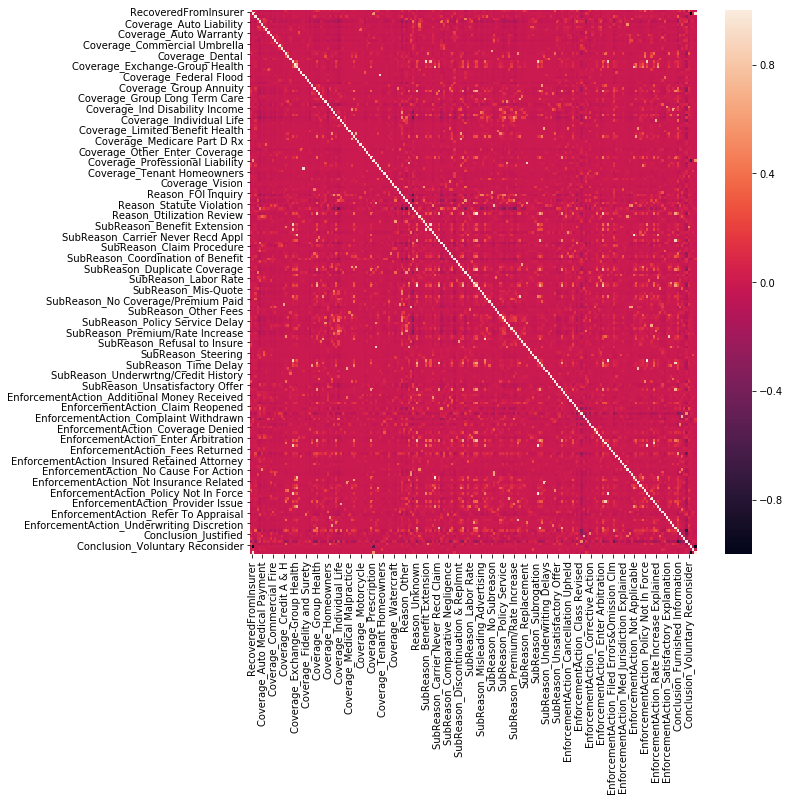

In [146]:

plt.figure(figsize=(10,10))
sns.heatmap(df_master_facts_with_Y.corr())
plt.show()


# Seperating y & X and Train-Test split.

#### Divided the data in to X (independent variables) and y (dependent or target variable).

In [147]:

X, y = df_master_facts_with_Y.loc[:,df_master_facts_with_Y.columns!='DRC'], df_master_facts_with_Y.loc[:,'DRC']


#### Created the train test split by using stratified sampling.

In [148]:

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.25, random_state = 0)


In [149]:

X_train.head(2)


,RecoveredFromInsurer,No_of_DaysToResolve,Coverage_A & H,Coverage_Auto,Coverage_Auto Liability,Coverage_Auto Medical Payment,Coverage_Auto Physical Damage,Coverage_Auto Uninsured Motorist,Coverage_Auto Warranty,Coverage_Commercial Auto,...,EnforcementAction_Usual & Custom Explained,Conclusion_Furnished Information,Conclusion_Justified,Conclusion_No Action Necessary,Conclusion_Questionable,Conclusion_Unjustified,Conclusion_Voluntary Reconsider,ResolutionStatus_Closed,ResolutionStatus_Open,ResolutionStatus_Re-Opened
37,1009.743118,24.806452,0.0,0.086022,0.408602,0.075269,0.150538,0.0,0.0,0.0,...,0.0,0.010753,0.301075,0.010753,0.010753,0.666667,0.000000,1.0,0.0,0.0
128,13754.967000,24.700000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,...,0.0,0.033333,0.100000,0.100000,0.033333,0.566667,0.166667,1.0,0.0,0.0


# Executing different models by doing different tricks.

## Without doing Standardization

#### Creating a dictionary to store Model objects dictionary.

In [150]:

dict_models_wo_standardization = MyClass().create_And_Fit_ML_Models(X_train, y_train, X_test, y_test, 'No Standardization -')


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ No Standardization - Naive Bayes Classifier ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Accuracy :  0.4740740740740741


Confusion Matrix

[[ 6  7 12]
 [ 7 11 23]
 [ 4 18 47]]


Classification report

              precision    recall  f1-score   support

           1       0.35      0.24      0.29        25
           2       0.31      0.27      0.29        41
           3       0.57      0.68      0.62        69

   micro avg       0.47      0.47      0.47       135
   macro avg       0.41      0.40      0.40       135
weighted avg       0.45      0.47      0.46       135



~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ No Standardization - Logistic Regression Classifier ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning:

Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.



Accuracy :  0.5259259259259259


Confusion Matrix

[[ 7  6 12]
 [10  8 23]
 [ 1 12 56]]


Classification report

              precision    recall  f1-score   support

           1       0.39      0.28      0.33        25
           2       0.31      0.20      0.24        41
           3       0.62      0.81      0.70        69

   micro avg       0.53      0.53      0.53       135
   macro avg       0.44      0.43      0.42       135
weighted avg       0.48      0.53      0.49       135



~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ No Standardization - KNN (k-nearest neighbours) classifier ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Accuracy :  0.5851851851851851


Confusion Matrix

[[10 11  4]
 [ 4 15 22]
 [ 7  8 54]]


Classification report

              precision    recall  f1-score   support

           1       0.48      0.40      0.43        25
           2       0.44      0.37      0.40        41
           3       0.68      0.78      0.72        69

   micro avg       0.59      0.59      0.59  

## Doing Standardization using Standar Scaler

In [151]:

scaleSS = StandardScaler()
scaleSS.fit(X_train)


StandardScaler(copy=True, with_mean=True, with_std=True)

In [152]:

X_train_stdScal = scaleSS.transform(X_train)
X_test_stdScal = scaleSS.transform(X_test)


In [153]:

dict_models_StandardScalar = MyClass().create_And_Fit_ML_Models(X_train_stdScal, y_train, X_test_stdScal, y_test, 'StdScaler -')


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ StdScaler - Naive Bayes Classifier ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Accuracy :  0.5703703703703704


Confusion Matrix

[[ 9 10  6]
 [ 4  9 28]
 [ 4  6 59]]


Classification report

              precision    recall  f1-score   support

           1       0.53      0.36      0.43        25
           2       0.36      0.22      0.27        41
           3       0.63      0.86      0.73        69

   micro avg       0.57      0.57      0.57       135
   macro avg       0.51      0.48      0.48       135
weighted avg       0.53      0.57      0.53       135



~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ StdScaler - Logistic Regression Classifier ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Accuracy :  0.4962962962962963


Confusion Matrix

[[11  9  5]
 [ 7 10 24]
 [ 5 18 46]]


Classification report

              precision    recall  f1-score   support

           1       0.48      0.44      0.46        25
           2       0.27      0.24      0.26        41
           3

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning:

Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.



 0.5111111111111111


Confusion Matrix

[[11  5  9]
 [11  9 21]
 [ 7 13 49]]


Classification report

              precision    recall  f1-score   support

           1       0.38      0.44      0.41        25
           2       0.33      0.22      0.26        41
           3       0.62      0.71      0.66        69

   micro avg       0.51      0.51      0.51       135
   macro avg       0.44      0.46      0.44       135
weighted avg       0.49      0.51      0.49       135



~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ StdScaler - Decision Tree classifier ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Accuracy :  0.7333333333333333


Confusion Matrix

[[18  5  2]
 [ 4 26 11]
 [ 4 10 55]]


Classification report

              precision    recall  f1-score   support

           1       0.69      0.72      0.71        25
           2       0.63      0.63      0.63        41
           3       0.81      0.80      0.80        69

   micro avg       0.73      0.73      0.73       135
   macro avg       0.71 

## Doing Standardization MinMaxScaler

In [154]:

scaleMMS = MinMaxScaler()
scaleMMS.fit(X_train)


MinMaxScaler(copy=True, feature_range=(0, 1))

In [155]:

X_train_stdMinMaxScal = scaleMMS.transform(X_train)
X_test_stdMinMaxScal = scaleMMS.transform(X_test)


In [156]:

dict_models_StandardMinMaxScalar = MyClass().create_And_Fit_ML_Models(X_train_stdMinMaxScal, y_train, X_test_stdMinMaxScal, y_test, 'MinMaxScaler -')


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ MinMaxScaler - Naive Bayes Classifier ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Accuracy :  0.562962962962963


Confusion Matrix

[[ 9 10  6]
 [ 4 10 27]
 [ 4  8 57]]


Classification report

              precision    recall  f1-score   support

           1       0.53      0.36      0.43        25
           2       0.36      0.24      0.29        41
           3       0.63      0.83      0.72        69

   micro avg       0.56      0.56      0.56       135
   macro avg       0.51      0.48      0.48       135
weighted avg       0.53      0.56      0.53       135



~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ MinMaxScaler - Logistic Regression Classifier ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Accuracy :  0.5555555555555556


Confusion Matrix

[[ 8  8  9]
 [ 9  9 23]
 [ 2  9 58]]


Classification report

              precision    recall  f1-score   support

           1       0.42      0.32      0.36        25
           2       0.35      0.22      0.27        41
       

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning:

Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.



Accuracy :  0.7555555555555555


Confusion Matrix

[[18  5  2]
 [ 3 22 16]
 [ 0  7 62]]


Classification report

              precision    recall  f1-score   support

           1       0.86      0.72      0.78        25
           2       0.65      0.54      0.59        41
           3       0.78      0.90      0.83        69

   micro avg       0.76      0.76      0.76       135
   macro avg       0.76      0.72      0.73       135
weighted avg       0.75      0.76      0.75       135



Model Scores 

                                          Model Name  Score
0              MinMaxScaler - Naive Bayes Classifier  56.30
1      MinMaxScaler - Logistic Regression Classifier  55.56
2  MinMaxScaler - KNN (k-nearest neighbours) clas...  55.56
3            MinMaxScaler - Decision Tree classifier  72.59
4            MinMaxScaler - Random Forest classifier  75.56




# Trying some advance models with Grid Search.

In [157]:

dict_AdvModels_AccuracyScore = {}


# Decision Tree Classifier

In [158]:

param_grid_dt = {'criterion': ['entropy'], 
                 'max_depth': [6,8,10,12], 
                 'max_features':['log2']}


In [159]:

dt_adv = DecisionTreeClassifier()
dt_grid = GridSearchCV(dt_adv, param_grid=param_grid_dt, cv=5)
dt_grid.fit(X_train_stdMinMaxScal,y_train)


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning:

The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.



GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'criterion': ['entropy'], 'max_depth': [6, 8, 10, 12], 'max_features': ['log2']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [160]:

dt_best = dt_grid.best_estimator_
print(f"The best parameters are {dt_grid.best_params_}")


The best parameters are {'criterion': 'entropy', 'max_depth': 6, 'max_features': 'log2'}


In [161]:

test_pred = dt_best.predict(X_test_stdMinMaxScal)


In [162]:

advModelsAccuracy = accuracy_score(y_test, test_pred)
print(f"Accuracy - Test data \n{advModelsAccuracy}")


Accuracy - Test data 
0.45185185185185184


In [163]:

dict_AdvModels_AccuracyScore['Decision Tree Classifier'] = advModelsAccuracy


In [164]:

# tree_to_code(dt_adv, list(X.columns))


# Random Forest

In [271]:

param_grid_rf = {"n_estimators" : [380, 400, 410],
              "max_depth" : [12, 15, 17],
              "max_features" : [45, 48, 50],
              "min_samples_leaf" : [6, 7, 8]}
# Accuracy = 80.00%
# {'max_depth': 15, 'max_features': 48, 'min_samples_leaf': 6, 'n_estimators': 400}

#param_grid_rf = {"n_estimators" : [395, 397, 400],
#              "max_depth" : [15, 16],
#              "max_features" : [47, 48, 49],
#              "min_samples_leaf" : [5, 6, 7]}
# Accuracy = 80.00%
# {'max_depth': 16, 'max_features': 48, 'min_samples_leaf': 6, 'n_estimators': 395}



In [272]:

rf_adv = RandomForestClassifier()
clf_rf_adv = GridSearchCV(rf_adv, param_grid_rf, cv=5)
clf_rf_adv.fit(X_train_stdMinMaxScal, y_train)


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning:

The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.



GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'n_estimators': [380, 400, 410], 'max_depth': [12, 15, 17], 'max_features': [45, 48, 50], 'min_samples_leaf': [6, 7, 8]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [273]:

print(f"The best parameters combination for Random Forest are {clf_rf_adv.best_params_}")


The best parameters combination for Random Forest are {'max_depth': 12, 'max_features': 45, 'min_samples_leaf': 6, 'n_estimators': 410}


In [274]:

test_pred = clf_rf_adv.predict(X_test_stdMinMaxScal)


In [275]:

advModelsAccuracy = accuracy_score(y_test, test_pred)
print(f"Accuracy - Test data \n{advModelsAccuracy}")


Accuracy - Test data 
0.7925925925925926


In [276]:

dict_AdvModels_AccuracyScore['Random Forest'] = advModelsAccuracy


# XGBoost

In [197]:

# param_grid_xgbm = {'learning_rate':[0.1,0.5], 
#                   'n_estimators': [20], 
#                   'subsample': [0.3,0.9]}
# Accuracy = 80.74%
# {'learning_rate': 0.5, 'n_estimators': 20, 'subsample': 0.9}

param_grid_xgbm = {'learning_rate':[0.5, 0.4, 0.3], 
                   'n_estimators': [20, 30], 
                   'subsample': [0.3,0.9]}
# Accuracy = 80.74%
# {'learning_rate': 0.5, 'n_estimators': 20, 'subsample': 0.9}


In [198]:

xgbm_adv = xgb.XGBClassifier()
xgbm_grid = GridSearchCV(xgbm_adv, param_grid_xgbm, cv=5)
xgbm_grid.fit(X_train_stdMinMaxScal, y_train)


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning:

The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.



GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=3, min_child_weight=1, missing=None,
       n_estimators=100, n_jobs=1, nthread=None,
       objective='binary:logistic', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
       subsample=1, verbosity=1),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'learning_rate': [0.5, 0.4, 0.3], 'n_estimators': [20, 30], 'subsample': [0.3, 0.9]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [199]:

xgbm_best = xgbm_grid.best_estimator_
print(f"The best parameters are {xgbm_grid.best_params_}")


The best parameters are {'learning_rate': 0.4, 'n_estimators': 30, 'subsample': 0.9}


In [200]:

test_pred = xgbm_best.predict(X_test_stdMinMaxScal)


In [201]:

advModelsAccuracy = accuracy_score(y_test, test_pred)
print(f"Accuracy - Test data \n{advModelsAccuracy}")


Accuracy - Test data 
0.8148148148148148


In [202]:

dict_AdvModels_AccuracyScore['XGBoost'] = advModelsAccuracy


# Gradient Boost Classifier

In [177]:

param_grid_gbm = {'max_depth': [8,10,12,14], 
                  'subsample': [0.8, 0.6,], 
                  'max_features':[0.2, 0.3], 
                  'n_estimators': [10, 20, 30]}
# Accuracy = 80.74%
#{'max_depth': 12, 'max_features': 0.2, 'n_estimators': 20, 'subsample': 0.8}

# param_grid_gbm = {'max_depth': [12,13,14], 
#                  'subsample': [0.8, 0.7,], 
#                  'max_features':[0.2, 0.3], 
#                  'n_estimators': [20, 25, 30]}
# Accuracy = 79.25%
# {'max_depth': 13, 'max_features': 0.3, 'n_estimators': 25, 'subsample': 0.8}

# param_grid_gbm = {'max_depth': [12,13,14], 
#                  'subsample': [0.8, 0.9,], 
#                  'max_features':[0.3, 0.4], 
#                  'n_estimators': [25, 27, 30]}
# Accuracy = 77.77%
# {'max_depth': 13, 'max_features': 0.3, 'n_estimators': 25, 'subsample': 0.8}

In [178]:

gbm_adv = GradientBoostingClassifier()
gbm_grid = GridSearchCV(gbm_adv, param_grid=param_grid_gbm, cv=5)
gbm_grid.fit(X_train_stdMinMaxScal,y_train)


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning:

The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.



GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_sampl...      subsample=1.0, tol=0.0001, validation_fraction=0.1,
              verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_depth': [8, 10, 12, 14], 'subsample': [0.8, 0.6], 'max_features': [0.2, 0.3], 'n_estimators': [10, 20, 30]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [179]:

gbm_best = gbm_grid.best_estimator_
print(f"The best parameters are {gbm_grid.best_params_}")


The best parameters are {'max_depth': 12, 'max_features': 0.3, 'n_estimators': 30, 'subsample': 0.8}


In [180]:

test_pred = gbm_best.predict(X_test_stdMinMaxScal)


In [181]:

advModelsAccuracy = accuracy_score(y_test, test_pred)
print(f"Accuracy - Test data \n{advModelsAccuracy}")


Accuracy - Test data 
0.8222222222222222


In [182]:

dict_AdvModels_AccuracyScore['Gradient Boost Classifier'] = advModelsAccuracy


# AdaBoost Classifier

In [183]:

param_grid_ada = {'n_estimators': [20,40,60], 'learning_rate':[0.5,1.0]}
base_estimator = DecisionTreeClassifier(criterion='gini', max_depth=10)


In [184]:

ada_adv = AdaBoostClassifier(base_estimator=base_estimator)
ada_grid = GridSearchCV(ada_adv, param_grid=param_grid_ada, cv=5)
ada_grid.fit(X_train_stdMinMaxScal,y_train)


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning:

The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.



GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=AdaBoostClassifier(algorithm='SAMME.R',
          base_estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
          learning_rate=1.0, n_estimators=50, random_state=None),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'n_estimators': [20, 40, 60], 'learning_rate': [0.5, 1.0]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [185]:

ada_best = ada_grid.best_estimator_
print(f"The best parameters are {ada_grid.best_params_}")


The best parameters are {'learning_rate': 0.5, 'n_estimators': 20}


In [186]:

test_pred = ada_best.predict(X_test_stdMinMaxScal)


In [187]:

advModelsAccuracy = accuracy_score(y_test, test_pred)
print(f"Accuracy - Test data \n{advModelsAccuracy}")


Accuracy - Test data 
0.7111111111111111


In [188]:

dict_AdvModels_AccuracyScore['AdaBoost Classifier'] = advModelsAccuracy


In [277]:

df_Adv_ModelScores = pd.DataFrame(list(dict_AdvModels_AccuracyScore.items()), columns=['Model Name', 'Score'])
df_Adv_ModelScores.Score = [round((item*100),2) for item in df_Adv_ModelScores.Score]
print('Model Scores \n')
print(df_Adv_ModelScores)
print('\n')


Model Scores 

                  Model Name  Score
0   Decision Tree Classifier  45.19
1              Random Forest  79.26
2                    XGBoost  81.48
3  Gradient Boost Classifier  82.22
4        AdaBoost Classifier  71.11




In [278]:

# Plotting and displaying Accuracies of all the models on a bar graph.
fig = px.bar(df_Adv_ModelScores, x="Model Name", y="Score", range_y=[0,100])
fig.show()
